# World Data League 2023

## 🎯 Challenge
*Avencas Marine Protected Area: Predict the future of the local ecosystem and its species*


## Team: Random Graphers
* José Almeida
* Juliana Machado
* Marta Colaço
* Rui Santos

## ✨ Introduction

The development section of this notebook is organized as follows:

1. Imports
2. EDA 
3. Data Preparation
4. Parameter estimation
5. Forecasting with ARIMA
6. Forecasting with Seasonality (ARIMA->SARIMA)
7. Including Exogenous Variables (SARIMA -> SARIMAX)
8. Including exogenous variables and other species (SARIMA -> SARIMAX)
9. Result Analysis

We start in the EDA section by visualizing sessile and mobile species, concluding that the data is very sparse and that most species are very rare. We also create plots to study invasive and threatened species, and then focus on species with a meaningful presence in the AMPA. We analyse variations in terms of zone (A, B, D or E), tidal area (supratidal or intertidal) and check for seasonality.

We then prepare the data prior to training the models (ARIMA, SARIMA or SARIMAX). Since the data points are not evenly spaced in time, the values were aggregated in terms of months. Alongside the different time series, satellite data was also collected from the NEO website [1] which consists of monthly measurements regarding different variables at coordinates close to the AMPA. Before training the model it is also essential to estimate suitable parameters, something performed through correlation plots.

Three models were then tested for different species. ARIMA is a standard time series forecasting model, SARIMA has the advantage of dealing with seasonality, and SARIMAX not only deals with seasonality but also allows the inclusion of exogenous variables. Ultimately, SARIMAX is capable of fulfilling the goals of this challenge since it predicts future variations while outputting feature importance.

In addition, we examined the interconnection between species, specifically investigating the potential relationship between invasive species and other species. Our aim was to determine if it would be worthwhile to explore additional species within the model. However, we observed that the few species exhibiting moderated correlations with invasive species had fewer available data points, and this pattern did not hold significance for the model as seen in the "8. Including exogenous variables and other species" section.

Concerning data quality, we performed descriptive analysis for each feature to check the overall usability of the dataset. This analysis led us to change misspelled observations, like "Super" to "Supra", so we could treat these cases, avoiding losing information. This step also revealed the existence of "High Tide" in the Substrate feature, which is not a substrate type, just a justification for periods where no species were collected due to the high tide, and these observations were dropped from the dataset. These steps are in the Appendix Section.



## 💻 Development

### 1. Import the libraries

In [ ]:
import numpy as np
import pandas as pd
from datetime import datetime
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

### 2. EDA

We started by observing the monthly percentages/frequencies for the sessile/mobile species. In the plots below, it is possible to see that most of the data consists of zeros, specially for mobile species. Therefore, predicting most species is unfeasible and we focus only on species with a relevant presence in the considered ecosystem. 

#### Sessile Species

In [ ]:
### Process sessile data for visualizations

data = pd.read_excel('AMPA_Data_Sample.xlsx', sheet_name=0)
data = data.dropna(subset=['Date'])
data = data[data['Zone']!='F'] # disregard zone F

datetime = data['Date']
months = [str(date).split('-')[1] for date in datetime]
years = [str(date).split('-')[0] for date in datetime]

data = data.iloc[:,9:-4]
data['Month'] = months
data['Year'] = years

for name, values in data.items():
    data[name] = pd.to_numeric(values, errors='coerce')

data = data.groupby(by=['Year', 'Month']).mean().reset_index() # compute monthly average
data = data.drop(columns=['Year', 'Month'])
data = data.reindex(data.mean().sort_values().index, axis=1).iloc[:,::-1] # sort based on species with higher mean values

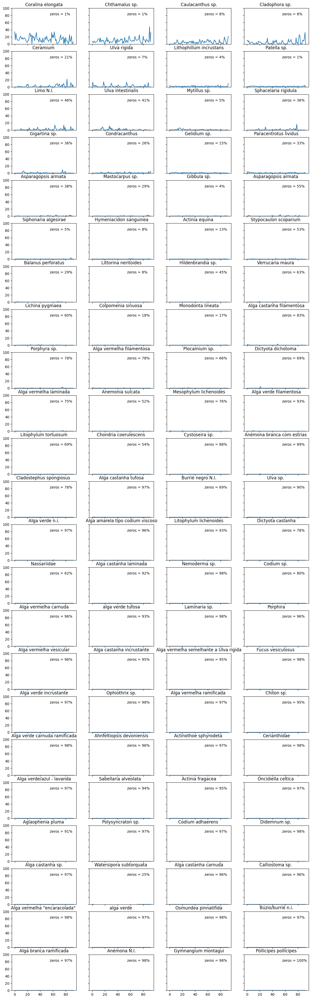

In [ ]:
### Plot sessile species

cols = data.columns
nrows = int(np.ceil(len(cols)/4))
fig, axs = plt.subplots(nrows=nrows, ncols=4)
fig.set_figwidth(15)
fig.set_figheight(50)

n = 0
for i in range(nrows):
  for j in range(4):
    name = cols[n]
    if '(' in name:
      name = name.split('(')[0]
    axs[i, j].set_title(name)
    axs[i, j].plot(data[cols[n]])
    axs[i, j].label_outer()
    axs[i, j].set_ylim(0, 100)
    zeros = np.sum(data[cols[n]]==0)/len(data)*100
    axs[i, j].text(55, 80, "zeros = %d%%"%(zeros), fontsize = 10) # add to plot percentage of zeros in the data
    n += 1
plt.show()

#### Mobile Species

In [ ]:
### Process mobile data for visualizations

data = pd.read_excel('AMPA_Data_Sample.xlsx', sheet_name=1)
data = data.dropna(subset=['Date'])
data = data[data['Zone']!='F']

data = data[data['Date']!='23-04-01-2020']
data = data[data['Date']!='14-10-2015']

datetime = data['Date']
months = [str(date).split('-')[1] for date in datetime]
years = [str(date).split('-')[0] for date in datetime]

data = data.iloc[:,9:-5]
data['Month'] = months
data['Year'] = years

for name, values in data.items():
    data[name] = pd.to_numeric(values, errors='coerce')

data = data.groupby(by=['Year', 'Month']).mean().reset_index()
data = data.drop(columns=['Year', 'Month'])
data = data.reindex(data.mean().sort_values().index, axis=1).iloc[:,::-1]

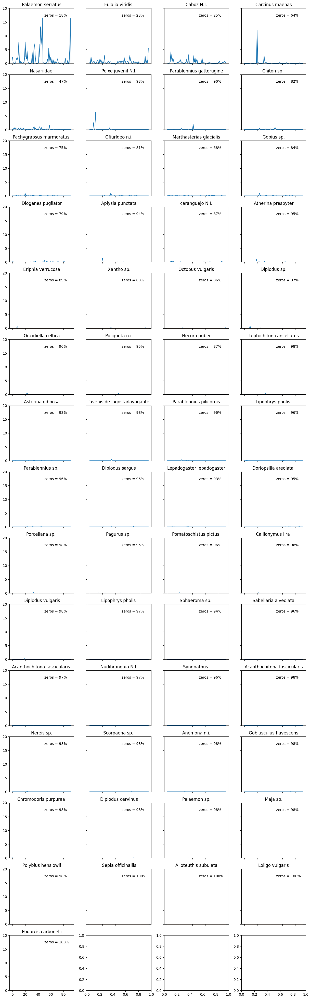

In [ ]:
### Plot mobile species

cols = data.columns
nrows = int(np.ceil(len(cols)/4))
fig, axs = plt.subplots(nrows=nrows, ncols=4)
fig.set_figwidth(15)
fig.set_figheight(50)

n = 0
for i in range(nrows):
  for j in range(4):
    name = cols[n]
    if '(' in name:
      name = name.split('(')[0]
    axs[i, j].set_title(name)
    axs[i, j].plot(data[cols[n]])
    axs[i, j].label_outer()
    axs[i, j].set_ylim(0, 20)
    zeros = np.sum(data[cols[n]]==0)/len(data)*100
    axs[i, j].text(50, 17, "zeros = %d%%"%(zeros), fontsize = 10)
    n += 1
    if n==len(cols):
      break
plt.show()

We also performed a more in depth analysis of invasive and commercially threatened species to understand the corresponding variations and if they could be used in our model. We divided the data between zones and between supratidal (supra) and intertidal (medium) regions to assess if any differences exist.

#### Invasive Species

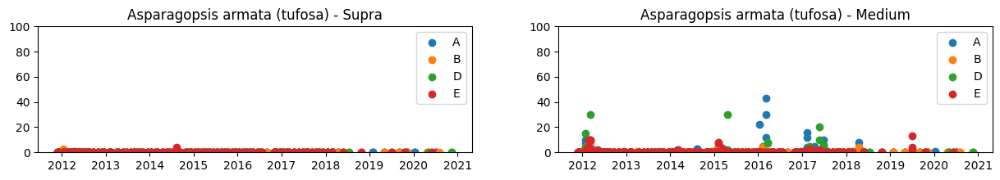

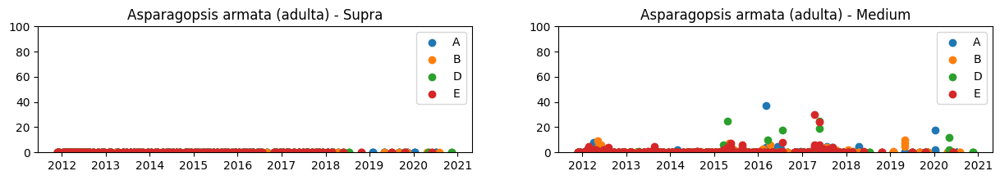

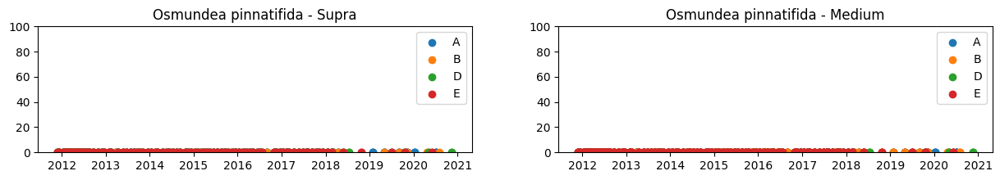

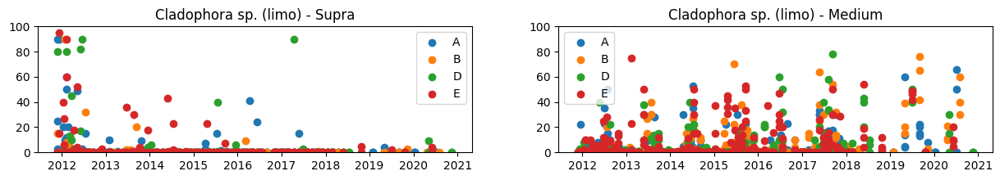

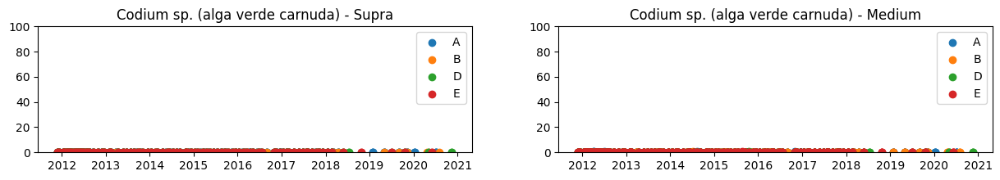

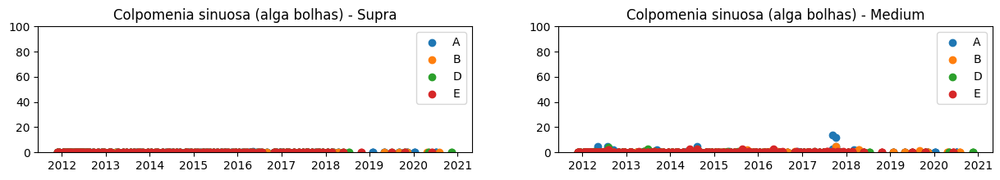

In [ ]:
### Plot invasive species

data = pd.read_excel('AMPA_Data_Sample.xlsx', sheet_name=0)

zones = ['A', 'B', 'D', 'E']
tidal = ['Supra', 'Medium']
invasive = ['Asparagopsis armata (tufosa)', 'Asparagopsis armata (adulta)', 'Osmundea pinnatifida', 'Cladophora sp. (limo)',
            'Codium sp. (alga verde carnuda)', 'Colpomenia sinuosa (alga bolhas)'] # invasive species

for specie in invasive:
    fig, axs = plt.subplots(nrows=1, ncols=2)
    fig.set_figwidth(15)
    fig.set_figheight(2)
    for i, tide in enumerate(tidal):
        axs[i].set_title(specie + ' - ' + tide)
        for zone in zones:
            subset = data[(data['Zone']==zone) & (data['Supratidal/Middle Intertidal']==tide)]
            dates = list(subset['Date'])
            values = list(subset[specie])
            axs[i].scatter(dates, values, label=zone)
            axs[i].set_ylim(0, 100)
        axs[i].legend()
    plt.show()

We can observe that invasive algae are preferentially located in intertidal regions. Their distributions vary to a certain degree according to the zone and there is also a clear seasonal pattern. Some of the invasive algae are practically inexistent at the AMPA during the observation period. Furthermore, the density of data points decreases in later years (2018, 2019, 2020) due to discontinuities in the data collection process.

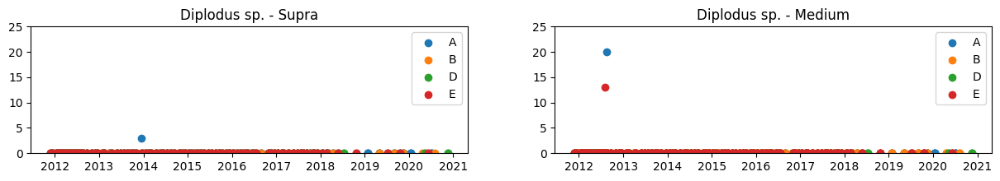

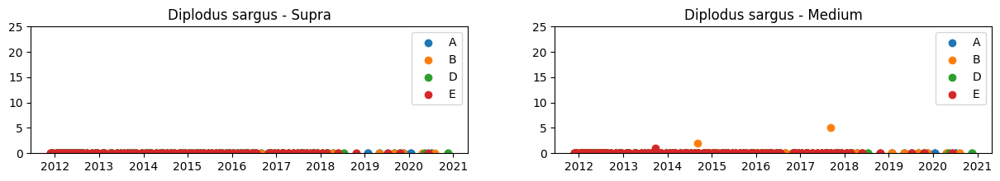

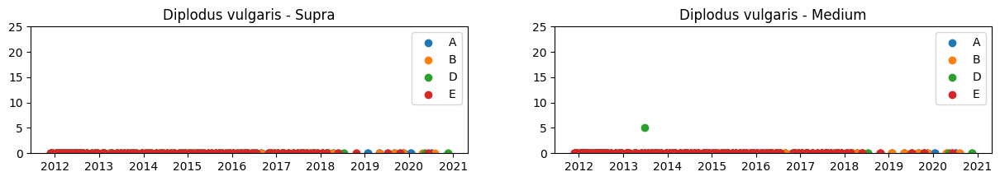

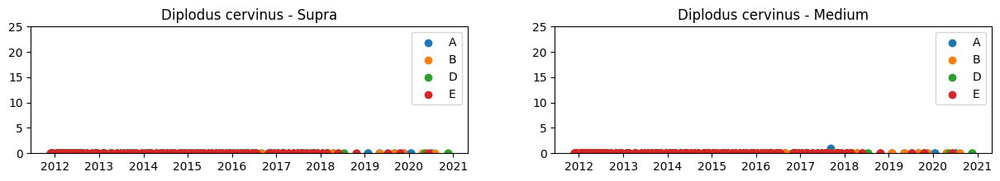

In [ ]:
data = pd.read_excel('AMPA_Data_Sample.xlsx', sheet_name=1)
data = data[data['Date']!='23-04-01-2020']
data = data[data['Date']!='14-10-2015']

zones = ['A', 'B', 'D', 'E']
tidal = ['Supra', 'Medium']
dangered = ['Diplodus sp.', 'Diplodus sargus', 'Diplodus vulgaris', 'Diplodus cervinus'] # commercially threatened species

for specie in dangered:
    fig, axs = plt.subplots(nrows=1, ncols=2)
    fig.set_figwidth(15)
    fig.set_figheight(2)
    for i, tide in enumerate(tidal):
        axs[i].set_title(specie + ' - ' + tide)
        for zone in zones:
            subset = data[(data['Zone']==zone) & (data['Supratidal/Middle Intertidal']==tide)]
            dates = list(subset['Date'])
            values = list(subset[specie])
            axs[i].scatter(dates, values, label=zone)
            axs[i].set_ylim(0, 25)
        axs[i].legend()
    plt.show()

Commercially threatened species are virtually inexistent and therefore they can't be modeled. We then decided to further explore relevant species and focus on differences between supratidal and intertidal regions.

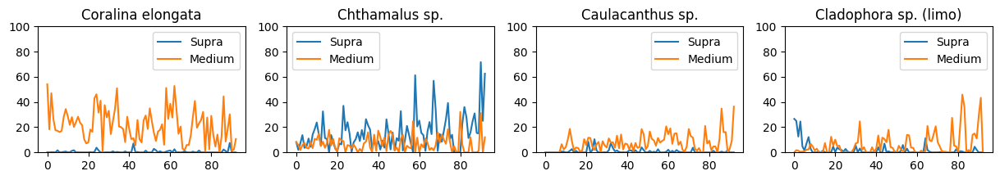

In [ ]:
### Process sessile data for visualizations

data = pd.read_excel('AMPA_Data_Sample.xlsx', sheet_name=0)
data = data.dropna(subset=['Date'])
data = data[data['Zone']!='F'] 

datetime = data['Date']
tide = data['Supratidal/Middle Intertidal']

months = [str(date).split('-')[1] for date in datetime]
years = [str(date).split('-')[0] for date in datetime]

species = ['Coralina elongata', 'Chthamalus sp.', 'Caulacanthus sp.', 'Cladophora sp. (limo)'] # most common sessile species
data = data[species]
data['Month'] = months
data['Year'] = years

for name, values in data.items():
    data[name] = pd.to_numeric(values, errors='coerce')

data['Tide'] = tide

data = data.groupby(by=['Year', 'Month', 'Tide']).mean().reset_index() 
data = data.drop(columns=['Year', 'Month'])

tidal = ['Supra', 'Medium']

fig, axs = plt.subplots(nrows=1, ncols=4)
fig.set_figwidth(15)
fig.set_figheight(2)
for i, specie in enumerate(species):
    axs[i].set_title(specie)
    for tide in tidal:
        subset = data[data['Tide']==tide]
        values = list(subset[specie])
        axs[i].plot(values, label=tide)
        axs[i].set_ylim(0, 100)
    axs[i].legend()
plt.show()

Again, significant differences between supratidal and intertidal regions are found, alongside seasonality indicators. Coralina elongata, an abundant algae species, is almost entirely located at intertidal regions and the opposite is verified for Chthamalus sp. 

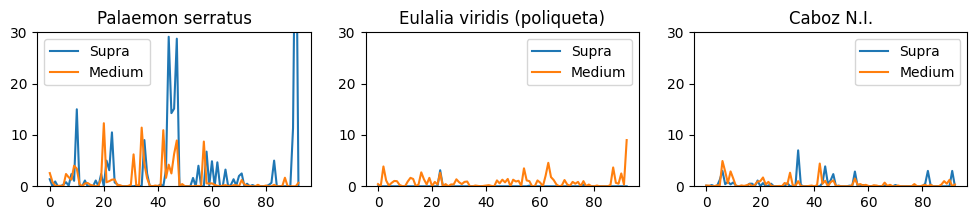

In [ ]:
### Process mobile data for visualizations

data = pd.read_excel('AMPA_Data_Sample.xlsx', sheet_name=1)
data = data.dropna(subset=['Date'])
data = data[data['Date']!='23-04-01-2020']
data = data[data['Date']!='14-10-2015']
data = data[data['Zone']!='F'] 

datetime = data['Date']
tide = data['Supratidal/Middle Intertidal']

months = [str(date).split('-')[1] for date in datetime]
years = [str(date).split('-')[0] for date in datetime]

species = ['Palaemon serratus', 'Eulalia viridis (poliqueta)', 'Caboz N.I.'] # most common mobile species
data = data[species]
data['Month'] = months
data['Year'] = years

for name, values in data.items():
    data[name] = pd.to_numeric(values, errors='coerce')

data['Tide'] = tide

data = data.groupby(by=['Year', 'Month', 'Tide']).mean().reset_index() 
data = data.drop(columns=['Year', 'Month'])

tidal = ['Supra', 'Medium']

fig, axs = plt.subplots(nrows=1, ncols=3)
fig.set_figwidth(12)
fig.set_figheight(2)
for i, specie in enumerate(species):
    axs[i].set_title(specie)
    for tide in tidal:
        subset = data[data['Tide']==tide]
        values = list(subset[specie])
        axs[i].plot(values, label=tide)
        axs[i].set_ylim(0, 30)
    axs[i].legend()
plt.show()

Fewer mobile species have significative abundance at the AMPA. There is one species that stands out, Palaemon serratus, which is a type of shrimp. Again, seasonality appears to be present.

### 3. Data Preparation

#### Importing data
We focus here on the sessile species, particularly those considered to be invasive. Additionally, we select two potentially endangered species --- *Coralina elongata* and *Chthamalus sp.* to assess whether this type of modelling is adequate.

In [ ]:
df = pd.read_excel("AMPA_Data_Sample.xlsx")
df["Asparagopsis armata"] = df["Asparagopsis armata (tufosa)"] + df["Asparagopsis armata (adulta)"]
df["Asparagopsis armata"] = df["Asparagopsis armata"]

invasive_species = [
    "Asparagopsis armata",
    "Osmundea pinnatifida",
    "Cladophora sp. (limo)",
    "Codium sp. (alga verde carnuda)",
    "Colpomenia sinuosa (alga bolhas)"]

other_species_modelling = [
    "Coralina elongata",
    "Chthamalus sp."]

other_species_exogenous = [
    "Gigartina sp. (língua do diabo)",
    "Ulva rigida"]

relevant_columns = ["Date","Hour","Tide","Weather Condition","Water temperature (ºC)",
                    "Sampler","Zone","tide_cat","Substrate"]

df["tide_cat"] = df["Supratidal/Middle Intertidal"]

#### Exogenous variables

Here, we focus predominantly on variables retrieved from NASA satellites. These readings have the advantage of being readily available and easy to format. Here, we picked the values for the zone closest to AMPA for the following variables:

* **AURA_NO2_M** - monthly surface nitric oxide ($\mathrm{NO_2}$) estimates
* **MOP_CO_M** - monthly carbon monoxide estimates
* **MY1DMM_CHLORA** - monthly chlorophyll estimates

In [ ]:
import os
from glob import glob

nasa_data = []
for file_name in glob("nasa_data/*"):
    tmp_nasa_df = pd.read_csv(file_name)
    tmp_nasa_df["Feature"] = file_name.split(os.sep)[-1][:-4]
    tmp_nasa_df["Year"] = [int(x.split("-")[0]) for x in tmp_nasa_df["date"]]
    tmp_nasa_df["Month"] = [int(x.split("-")[1]) for x in tmp_nasa_df["date"]]
    
    nasa_data.append(tmp_nasa_df)
    
nasa_data_df = pd.concat(nasa_data)
nasa_data_df = (nasa_data_df.pivot(index=["date","Year","Month"],columns="Feature",values="value")
                .reset_index()
                .dropna())
nasa_data_df.head()

Feature,date,Year,Month,AURA_NO2_M,MOP_CO_M,MY1DMM_CHLORA,MYD28M
1,2012-02,2012,2,360.0,115.7,2.6495,13.44
2,2012-03,2012,3,242.0,121.7,6.1506,14.61
3,2012-04,2012,4,65.0,129.9,2.7441,14.61
4,2012-05,2012,5,100.0,92.1,5.7338,16.50
5,2012-06,2012,6,106.0,82.7,4.3303,17.37


In [ ]:
# getting ride of NA, getting rid of wrong values in tide
df = df[~df["Substrate"].isna()]
df = df[~df["tide_cat"].isna()]
df["tide_cat"] = df["tide_cat"].str.strip(" ")

df["tide_cat"][df["tide_cat"] == "Super"] = "Supra"

In [ ]:
import datetime

df_relevant_columns = df[
    relevant_columns + invasive_species + other_species_modelling + other_species_exogenous]
df_relevant_columns.loc[:,"Month"] = df_relevant_columns["Date"].map(lambda x: x.month).astype(int)
df_relevant_columns.loc[:,"Year"] = df_relevant_columns["Date"].map(lambda x: x.year).astype(int)

for k in invasive_species + other_species_exogenous + other_species_modelling:
    print(k)
    print("",df_relevant_columns.shape)
    df_relevant_columns = df_relevant_columns[[str(x).replace(".","").isnumeric()
                                               for x in df_relevant_columns[k]]]
    print("",df_relevant_columns.shape)
    df_relevant_columns.loc[:,k] = df_relevant_columns[k].astype(float)

df_relevant_columns.head()

In [ ]:
df_long = pd.melt(df_relevant_columns,
                  id_vars=relevant_columns + ["Year","Month"] + other_species_exogenous,
                  value_vars=invasive_species + other_species_modelling)
df_long = df_long[df_long["Water temperature (ºC)"] != " "]
df_long = df_long[df_long["Water temperature (ºC)"] != "-"]
df_long["Water temperature (ºC)"] = df_long["Water temperature (ºC)"].astype(float)

substrate_cols = ["Sand","Rock","Puddle"]

for k in ["Clear sky","Sunny","Cloudy","Rain"]:
    df_long[k] = df_long["Weather Condition"].str.contains(k).astype(float)

for k in ["Sand","Rock","Puddle"]:
    df_long[k] = df_long["Substrate"].str.contains(k)
    
df_long.head()

,Date,Hour,Tide,Weather Condition,Water temperature (ºC),Sampler,Zone,tide_cat,Substrate,Year,...,Ulva rigida,variable,value,Clear sky,Sunny,Cloudy,Rain,Sand,Rock,Puddle
0,2011-11-28,12:20:00,0.6,Clear sky,16.0,AF SF,D,Supra,Rock,2011,...,0.0,Asparagopsis armata,0.0,1.0,0.0,0.0,0.0,False,True,False
1,2011-11-28,12:35:00,0.6,Clear sky,16.0,AF SF,D,Supra,Rock,2011,...,0.0,Asparagopsis armata,0.0,1.0,0.0,0.0,0.0,False,True,False
2,2011-11-28,10:10:00,0.6,Clear sky,16.0,AF SF,D,Medium,Puddle,2011,...,0.0,Asparagopsis armata,0.0,1.0,0.0,0.0,0.0,False,False,True
3,2011-11-28,10:25:00,0.6,Clear sky,16.0,AF SF,D,Medium,Rock,2011,...,0.0,Asparagopsis armata,0.0,1.0,0.0,0.0,0.0,False,True,False
4,2011-11-28,10:40:00,0.6,Clear sky,16.0,AF SF,D,Medium,Rock,2011,...,0.0,Asparagopsis armata,0.0,1.0,0.0,0.0,0.0,False,True,False


In [ ]:
def print_full(x):
    pd.set_option('display.max_rows', len(x))
    print(x)
    pd.reset_option('display.max_rows')

for var in df_long["variable"].unique():
    print_full(df_long[df_long["variable"] == var].groupby(["tide_cat","Zone","Sand","Rock","Puddle"]).agg(
        {"value":[lambda x: np.sum(x > 0), lambda x: x.shape[0]]}
    ))

### Data aggregation

Having observed that any given substrate has a high proportion of 0 values, it becomes imperative to select a method for data aggregation that renders some form of signal we can work with. To this effect:

1. First take out the maximum value for each **species** at each **tide**, **date**, **substrate** and **zone**;
2. Aggregate these values on a **monthly** basis, taking the **average** over each **month**/**year**/**tide**/**zone** combination

We aggregate at a *per* month level as i) the sampling was not frequent enough to enable a higher resolution and ii) this allows us to use the exogenous variables we retrieved.

In [ ]:
char_fn = ["max","mean","min","median"]

group_cols = ["Month",
              "Year",
              "tide_cat"]

weather_cols = ["Clear sky","Sunny","Cloudy","Rain"]

agg_dict_1 = {
      "value":"max",
      "Clear sky":"mean",
      "Sunny":"mean",
      "Cloudy":"mean",
      "Rain":"mean",
      "Water temperature (ºC)":"mean"}
agg_dict_2 = {
      "value":char_fn,
      "Clear sky":"mean",
      "Sunny":"mean",
      "Cloudy":"mean",
      "Rain":"mean",
      "Water temperature (ºC)":"mean"}

for k in other_species_exogenous:
    agg_dict_1[k] = "max"
    agg_dict_2[k] = "max"

df_agg = (df_long
 .groupby(group_cols + ["variable"] + ["Date"] + substrate_cols + ["Zone"])
 .agg(agg_dict_1)
 .groupby(group_cols + ["variable","Zone"])
 .agg(agg_dict_2)
 .reset_index())

col_names = group_cols + ["variable","Zone"] + char_fn + weather_cols
col_names = col_names + ["Temperature"] + other_species_exogenous
df_agg.columns = col_names

df_agg["Linear time"] = df_agg["Year"] + (df_agg["Month"]-1) / 12

df_agg

,Month,Year,tide_cat,variable,Zone,max,mean,min,median,Clear sky,Sunny,Cloudy,Rain,Temperature,Gigartina sp. (língua do diabo),Ulva rigida,Linear time
0,1,2012,Medium,Asparagopsis armata,A,10.0,2.220,0.0,0.1,1.0,0.0,0.0,0.0,16.2,0.0,2.0,2012.000000
1,1,2012,Medium,Asparagopsis armata,B,4.0,1.750,0.0,1.5,1.0,0.0,0.0,0.0,15.5,0.0,70.0,2012.000000
2,1,2012,Medium,Asparagopsis armata,D,15.0,4.000,0.0,0.5,1.0,0.0,0.0,0.0,16.0,0.0,0.1,2012.000000
3,1,2012,Medium,Asparagopsis armata,E,0.5,0.225,0.0,0.2,1.0,0.0,0.0,0.0,16.0,0.0,2.0,2012.000000
4,1,2012,Medium,Chthamalus sp.,A,0.0,0.000,0.0,0.0,1.0,0.0,0.0,0.0,16.2,0.0,2.0,2012.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4580,12,2017,Supra,Coralina elongata,E,0.0,0.000,0.0,0.0,0.0,0.0,1.0,0.0,14.9,0.0,0.0,2017.916667
4581,12,2017,Supra,Osmundea pinnatifida,A,0.0,0.000,0.0,0.0,0.0,0.0,1.0,0.0,13.3,0.0,0.0,2017.916667
4582,12,2017,Supra,Osmundea pinnatifida,B,0.0,0.000,0.0,0.0,0.0,0.0,1.0,0.0,13.3,0.0,0.0,2017.916667
4583,12,2017,Supra,Osmundea pinnatifida,D,0.0,0.000,0.0,0.0,0.0,0.0,1.0,0.0,14.9,0.0,0.0,2017.916667


### Some minimal aspects of the data and further commentary on aggregation

Inspecting different zones allows us to observe that zone F only started to be analysed much later in terms of invasive species. This creates obvious issues with modelling. For this reason we exclude zone F before further aggregating our data as the **mean across zones**. Additionally, we exclude *Codium sp.*, and *Osmundea pinafitida* as data is remarkably sparse.

We can tell relatively clearly that there are interesting motions by looking at some visualizations and descriptors for the data - *Cladophora sp.* increases in intratidal while it decreases in supratidal regions, *asparagopsis armata* appears to increase, *Colpomenia sinuosa* appears to have increased in intratidal regions until 2017, after which it diminshes.

In [ ]:
print_full(df_long.groupby(["variable"] + group_cols[1:][::-1]).agg({"value":["mean","max","median"]}))

                                                    value             
                                                     mean   max median
variable                         tide_cat Year                        
Asparagopsis armata              Medium   2011   0.044444   0.5   0.00
                                          2012   0.936051  30.0   0.00
                                          2013   0.078431   5.0   0.00
                                          2014   0.128302   3.0   0.00
                                          2015   0.897605  55.0   0.00
                                          2016   1.742958  67.0   0.00
                                          2017   1.428313  31.5   0.00
                                          2018   0.838462  15.0   0.00
                                          2019   1.403509  15.0   0.00
                                          2020   1.427273  18.0   0.00
                                 Supra    2011   0.000000   0.0   0.00
      

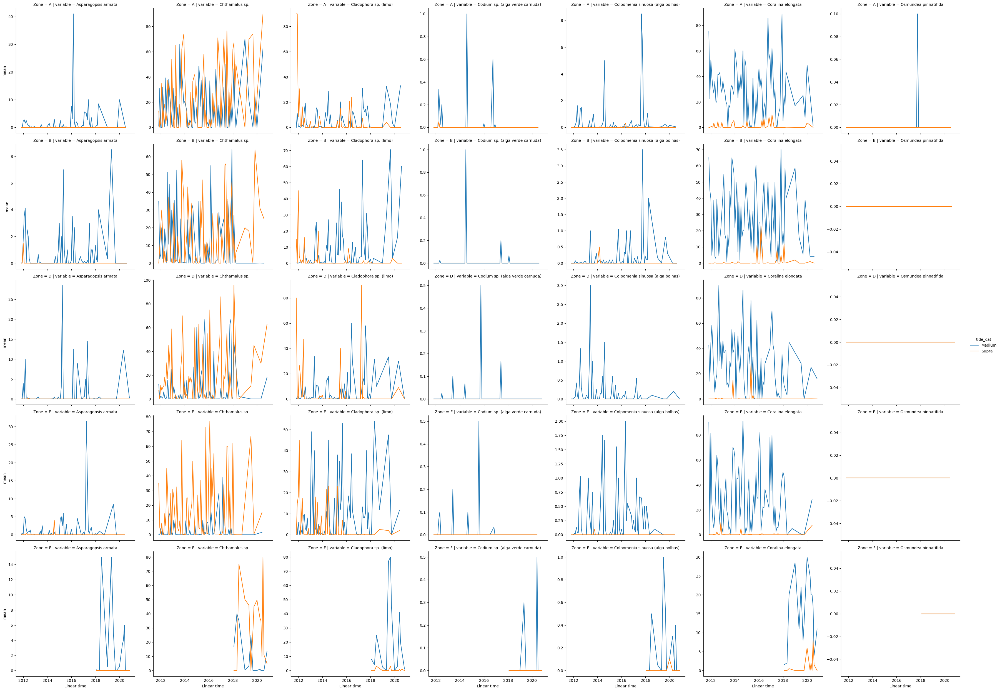

In [ ]:
# inspecting values along time
# seems largely useless to model Osmundea pinnatifida

import seaborn as sns
import matplotlib.pyplot as plt

sns.relplot(
    data=df_agg,
    x="Linear time", y="mean",
    hue="tide_cat", col="variable", row="Zone",
    kind="line",
    height=5, aspect=1.0, facet_kws=dict(sharey=False),
)

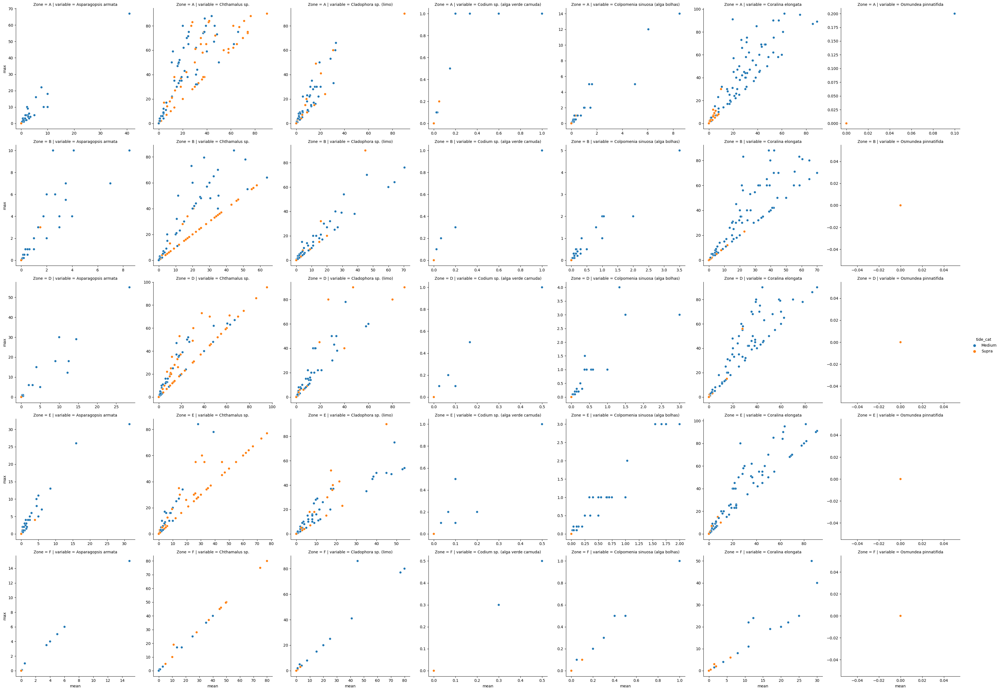

In [ ]:
sns.relplot(
    data=df_agg,
    x="mean", y="max",
    hue="tide_cat", col="variable", row="Zone",
    kind="scatter",
    height=5, aspect=1.0, facet_kws=dict(sharex=False,sharey=False),
)

In [ ]:
# recalculating aggregates, excluding zone

new_df_long = df_long[df_long["Zone"] != "F"]
new_df_long = df_long[df_long["variable"] != "Codium sp. (alga verde carnuda)"]
new_df_long = df_long[df_long["variable"] != "Osmundea pinnatifida"]

df_agg = (new_df_long
 .groupby(group_cols + ["variable"] + ["Date"] + substrate_cols + ["Zone"])
 .agg(agg_dict_1)
 .groupby(group_cols + ["variable"])
 .agg(agg_dict_2)
 .reset_index())

df_agg.columns = [x for x in col_names if x != "Zone"]

df_agg["Linear time"] = df_agg["Year"] + (df_agg["Month"]-1) / 12

df_agg

,Month,Year,tide_cat,variable,max,mean,min,median,Clear sky,Sunny,Cloudy,Rain,Temperature,Gigartina sp. (língua do diabo),Ulva rigida,Linear time
0,1,2012,Medium,Asparagopsis armata,15.0,2.058824,0.0,0.2,1.0,0.0,0.0,0.0,15.941176,0.0,70.0,2012.000000
1,1,2012,Medium,Chthamalus sp.,20.0,2.764706,0.0,0.0,1.0,0.0,0.0,0.0,15.941176,0.0,70.0,2012.000000
2,1,2012,Medium,Cladophora sp. (limo),10.0,2.117647,0.0,0.0,1.0,0.0,0.0,0.0,15.941176,0.0,70.0,2012.000000
3,1,2012,Medium,Codium sp. (alga verde carnuda),0.0,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,15.941176,0.0,70.0,2012.000000
4,1,2012,Medium,Colpomenia sinuosa (alga bolhas),0.0,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,15.941176,0.0,70.0,2012.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1111,12,2017,Supra,Chthamalus sp.,46.0,16.400000,0.0,0.0,0.0,0.0,1.0,0.0,14.260000,0.0,0.0,2017.916667
1112,12,2017,Supra,Cladophora sp. (limo),0.0,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,14.260000,0.0,0.0,2017.916667
1113,12,2017,Supra,Codium sp. (alga verde carnuda),0.0,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,14.260000,0.0,0.0,2017.916667
1114,12,2017,Supra,Colpomenia sinuosa (alga bolhas),0.0,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,14.260000,0.0,0.0,2017.916667


### 4. Parameter Estimation

### Analysing autocorrelations to estimate ARIMA parameters

To proceed with ARIMA models, we must first estimate three parameters - p, d and m. The moving average parameter (m) will be set identifically to q for simplicity.

#### Estimating autoregressive order (p)

p tells us how many steps back we need to look to produce estimates for the current time. In general, the species that _can_ be modelled usually appear to be associated only with p=1.

A visual inspection here also tells us that modelling some species is not possible due to the sparsity of our data. *Asparagopsis armata* in supratidal terrain which have few registered variations. 

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


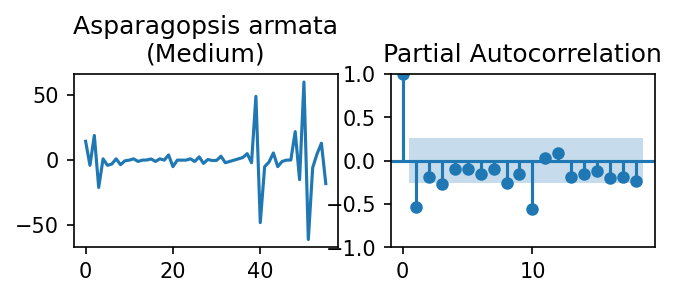

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


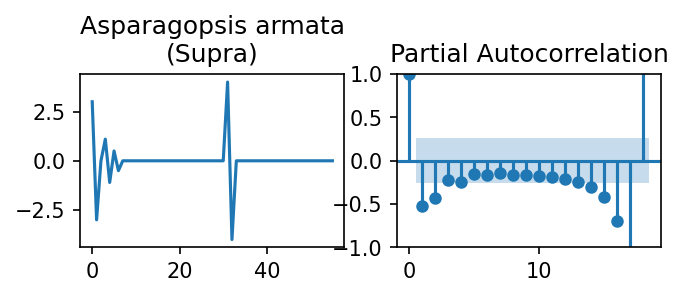

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


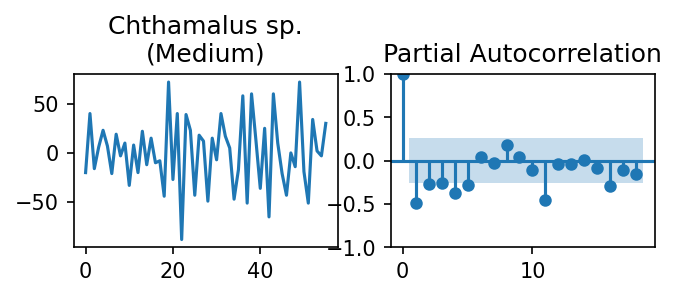

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


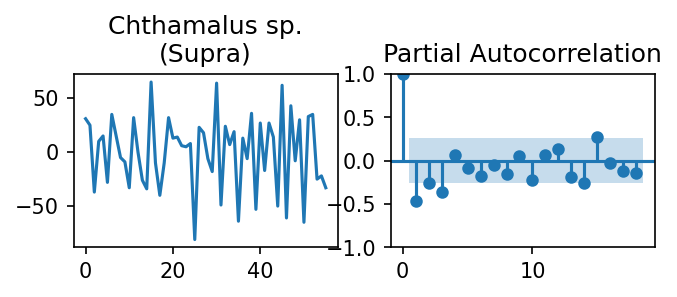

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


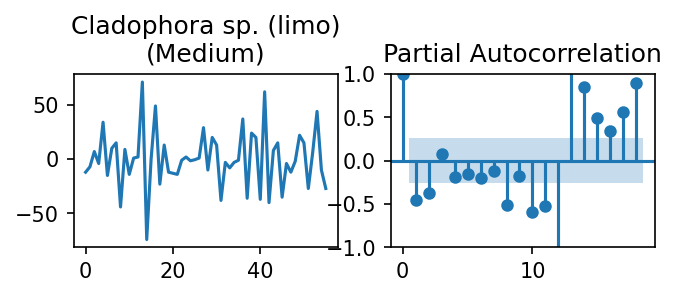

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


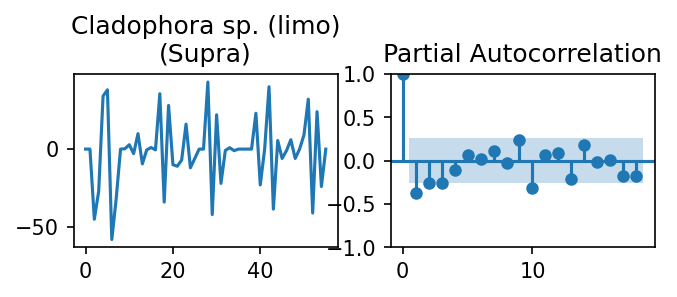

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


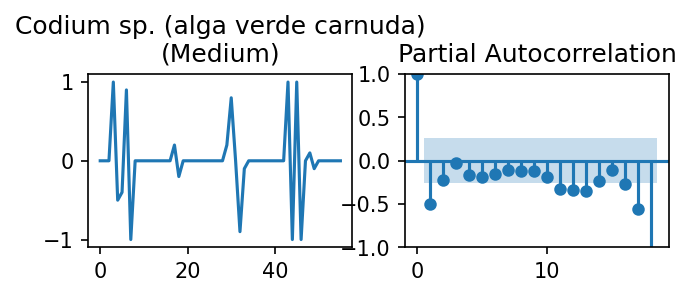

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


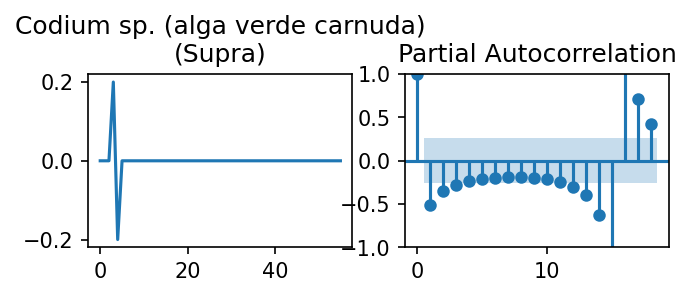

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


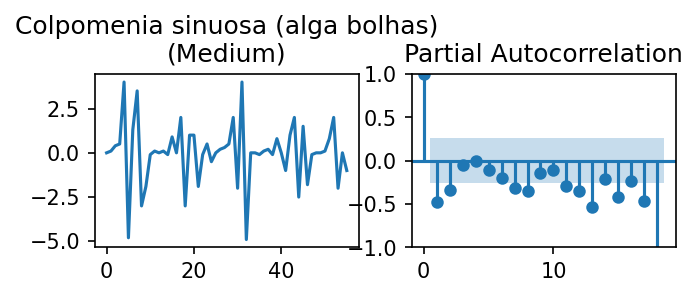

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


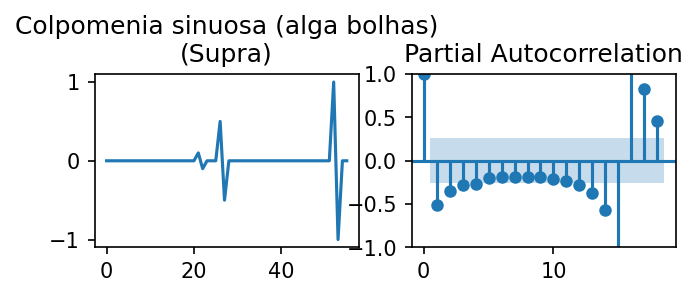

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


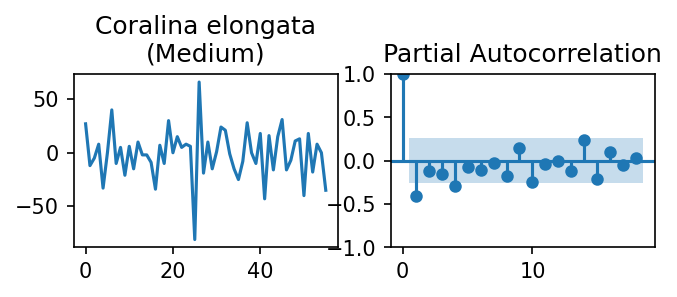

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


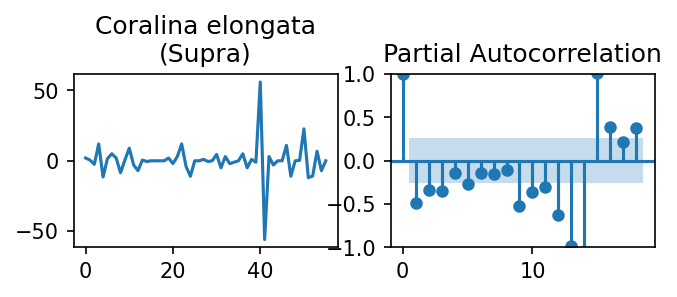

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import adfuller

def mode(x):
    u,c = np.unique(x,return_counts=True)
    return u[c.argmax()]

def get_contiguous_idxs(t):
    t_diff = np.diff(t)
    t_mode = mode(t_diff)
    segments = np.where(np.isclose(t_diff, t_mode),0,1)
    segments = np.cumsum(segments)
    segment_mode = mode(segments)
    longest_segment_idxs = np.where(segments == segment_mode)[0] + 1
    return longest_segment_idxs

plt.rcParams["figure.figsize"] = [5,1.5]
plt.rcParams["figure.dpi"] = 150

param = "max"

for var in df_agg["variable"].unique():
    for tide_cat in df_agg["tide_cat"].unique():
        tmp = df_agg.loc[(df_agg.loc[:,"variable"] == var) 
                         * (df_agg.loc[:,"tide_cat"] == tide_cat)]
        tmp = tmp.sort_values("Linear time")
        tmp = tmp.iloc[get_contiguous_idxs(tmp["Linear time"])]
        if np.var(np.diff(tmp[param])) > 0:
            fig,ax = plt.subplots(1,2)
            plot_pacf(np.diff(tmp[param]),ax=ax[1])
            
            sns.lineplot(np.diff(tmp[param]),ax=ax[0])
            
            ax[1].yaxis.label.set_visible(False)

            ax[0].set_title("{}\n({})".format(var,tide_cat))

            plt.show()

#### Estimating the order of differencing (d)

This step allows us to get a sense of how many orders of differencing should be used (how many steps back are we willing to look back). For most species there appears to be a very early cut-off (i.e. small autocorrelation at d=1, significant Augment Dicker-Fuller at this order of differencing); this tells us that d=1 is a good value to carry forward.

For clarity: 
* We check here whether the order of differencing in the maximum invasive species prevalence is stationary (i.e. no auto-correlation). To do so, we use the Augmented Dickey-Fuller, which tells us whether our series is non-stationary (p-value > 0.05) or stationary (p-value < 0.05). This is important as stationarity (i.e. the parameters of the series, a stochastic process, do not change as the series progresses) is a prerequisite of ARIMA

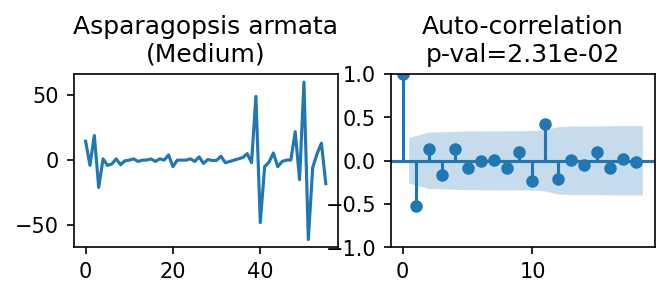

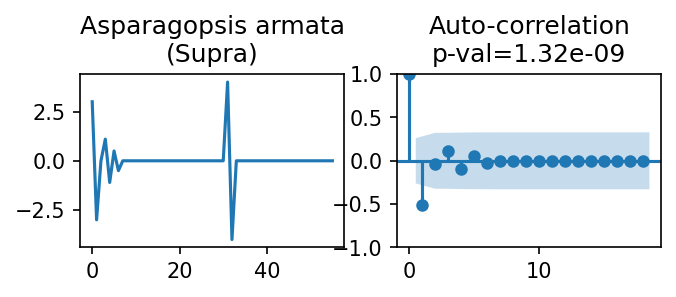

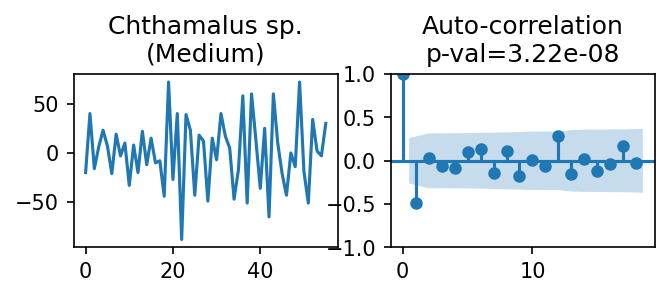

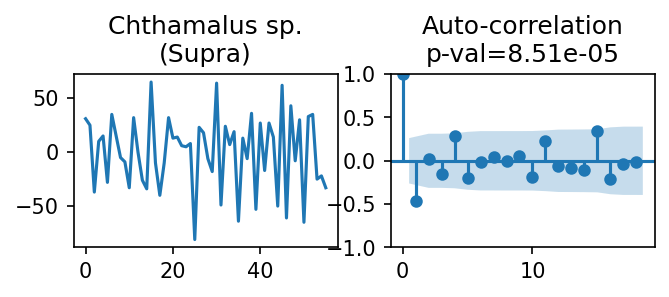

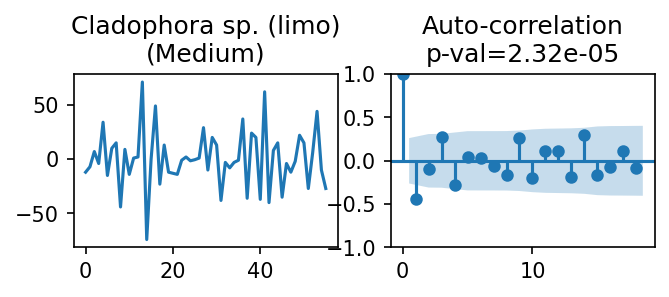

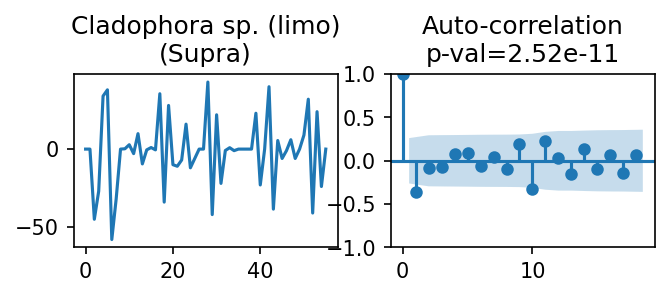

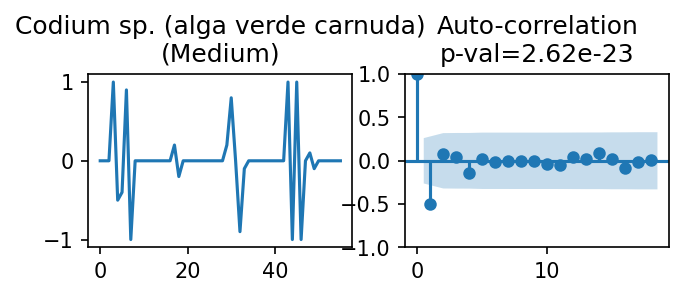

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:940: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


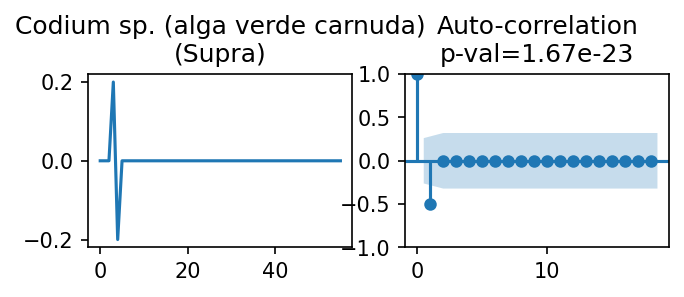

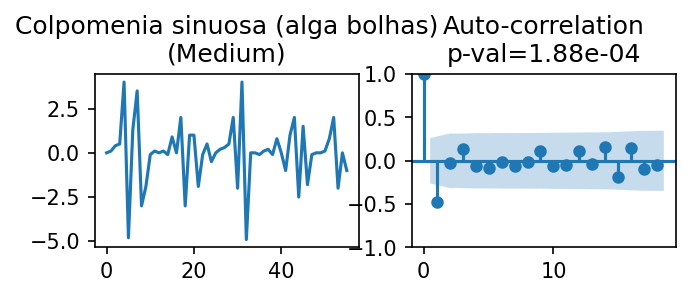

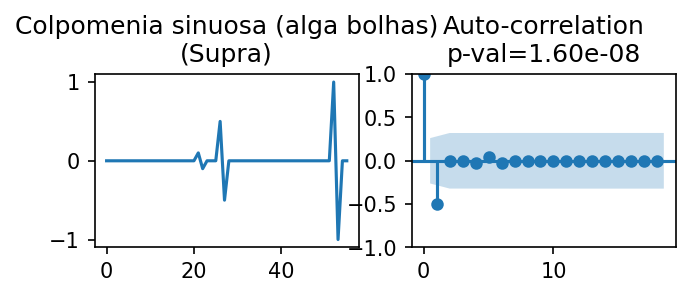

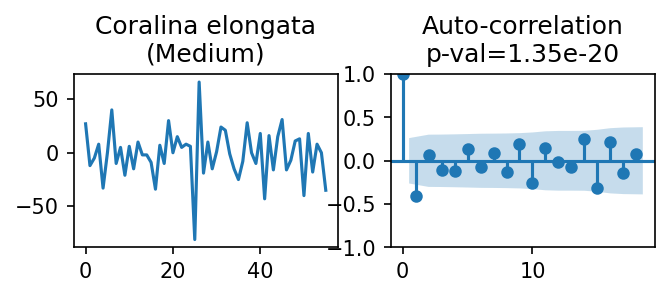

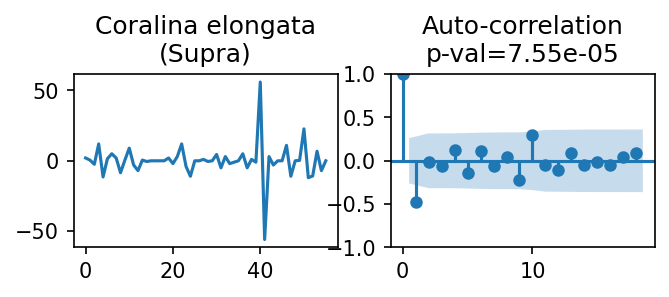

In [ ]:
plt.rcParams["figure.figsize"] = [5,1.5]

param = "max"

for var in df_agg["variable"].unique():
    for tide_cat in df_agg["tide_cat"].unique():
        tmp = df_agg.loc[(df_agg.loc[:,"variable"] == var) 
                         * (df_agg.loc[:,"tide_cat"] == tide_cat)]
        tmp = tmp.sort_values("Linear time")
        tmp = tmp.iloc[get_contiguous_idxs(tmp["Linear time"])]
        if np.var(np.diff(tmp[param])) > 0:
            fig,ax = plt.subplots(1,2)
            plot_acf(np.diff(tmp[param]),ax=ax[1])
            
            sns.lineplot(np.diff(tmp[param]),ax=ax[0])
            
            p_val = adfuller(np.diff(tmp[param]))[1]

            ax[1].yaxis.label.set_visible(False)

            ax[0].set_title("{}\n({})".format(var,tide_cat))
            ax[1].set_title("Auto-correlation\np-val={:.2e}".format(p_val))

            plt.show()

### 5. Forecasting with ARIMA

We first start by considering the simple AR model with one moving average term. In general, this does not perform remarkably well.

['Asparagopsis armata', 'Medium', 'max', 1]


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


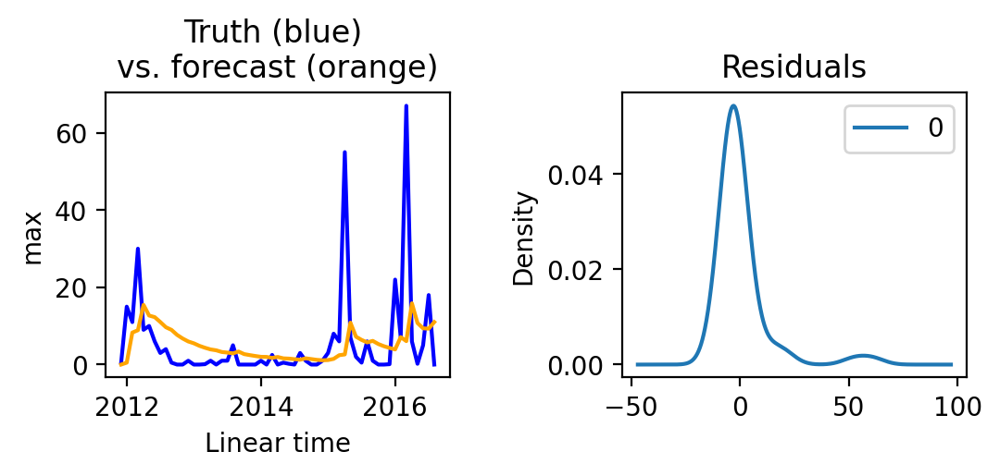

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -220.760
Date:                Thu, 18 May 2023   AIC                            447.519
Time:                        21:33:13   BIC                            453.596
Sample:                             0   HQIC                           449.875
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0685      0.247      0.277      0.782      -0.416       0.553
ma.L1         -0.9068      0.127     -7.162      0.000      -1.155      -0.659
sigma2       151.0716     11.844     12.755      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


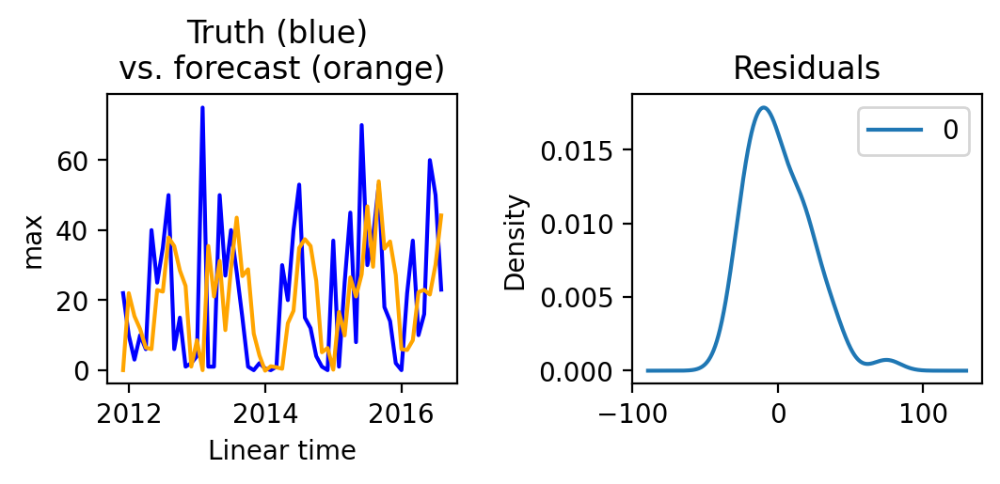

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -251.049
Date:                Thu, 18 May 2023   AIC                            510.099
Time:                        21:33:14   BIC                            518.200
Sample:                             0   HQIC                           513.240
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9264      0.277     -3.344      0.001      -1.469      -0.383
ar.L2         -0.5067      0.162     -3.136      0.002      -0.823      -0.190
ma.L1          0.3636      0.321      1.134      0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


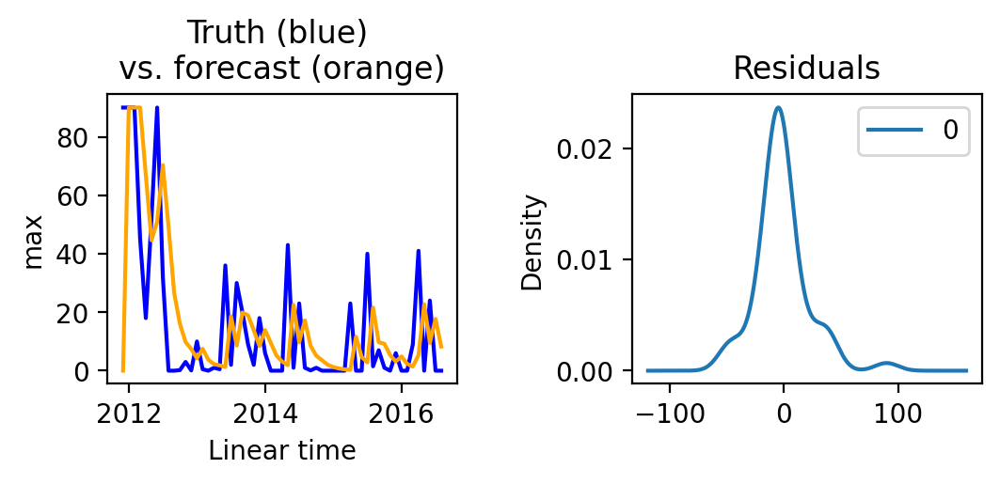

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -245.804
Date:                Thu, 18 May 2023   AIC                            497.608
Time:                        21:33:14   BIC                            503.684
Sample:                             0   HQIC                           499.964
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1021      0.211      0.484      0.629      -0.312       0.516
ma.L1         -0.6049      0.205     -2.953      0.003      -1.006      -0.203
sigma2       378.0242     67.201      5.625      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


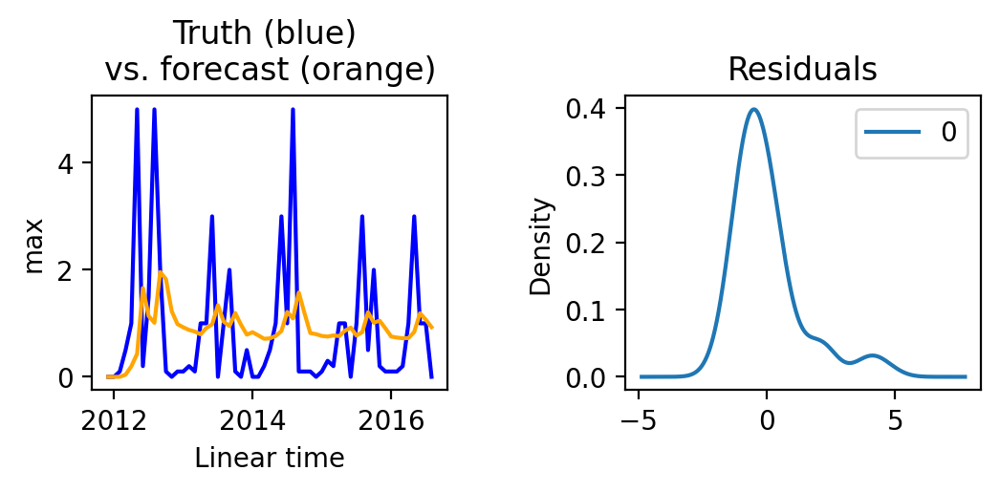

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(2, 1, 1)   Log Likelihood                 -94.921
Date:                Thu, 18 May 2023   AIC                            197.842
Time:                        21:33:15   BIC                            205.944
Sample:                             0   HQIC                           200.983
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1273      0.180      0.705      0.481      -0.226       0.481
ar.L2          0.0696      0.141      0.493      0.622      -0.207       0.346
ma.L1         -0.9995     14.057     -0.071      0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


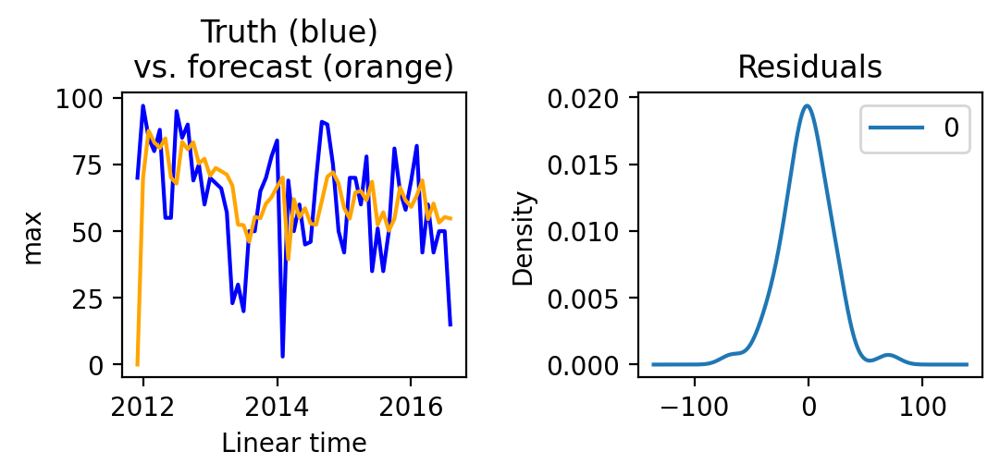

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -246.551
Date:                Thu, 18 May 2023   AIC                            499.101
Time:                        21:33:15   BIC                            505.177
Sample:                             0   HQIC                           501.457
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2975      0.179      1.666      0.096      -0.053       0.648
ma.L1         -0.9023      0.122     -7.398      0.000      -1.141      -0.663
sigma2       382.5919     70.895      5.397      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


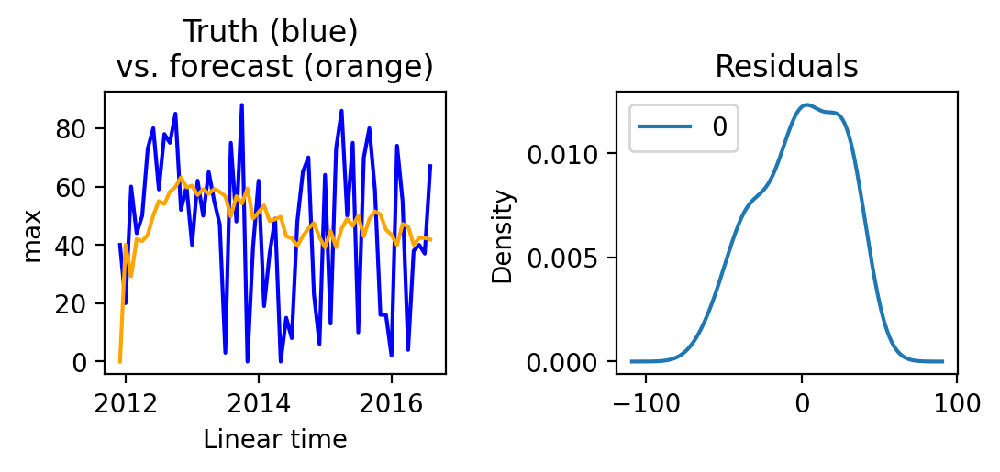

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -263.053
Date:                Thu, 18 May 2023   AIC                            532.105
Time:                        21:33:15   BIC                            538.181
Sample:                             0   HQIC                           534.461
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0718      0.149      0.484      0.629      -0.219       0.363
ma.L1         -0.9395      0.068    -13.840      0.000      -1.073      -0.806
sigma2       679.2724    167.915      4.045      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


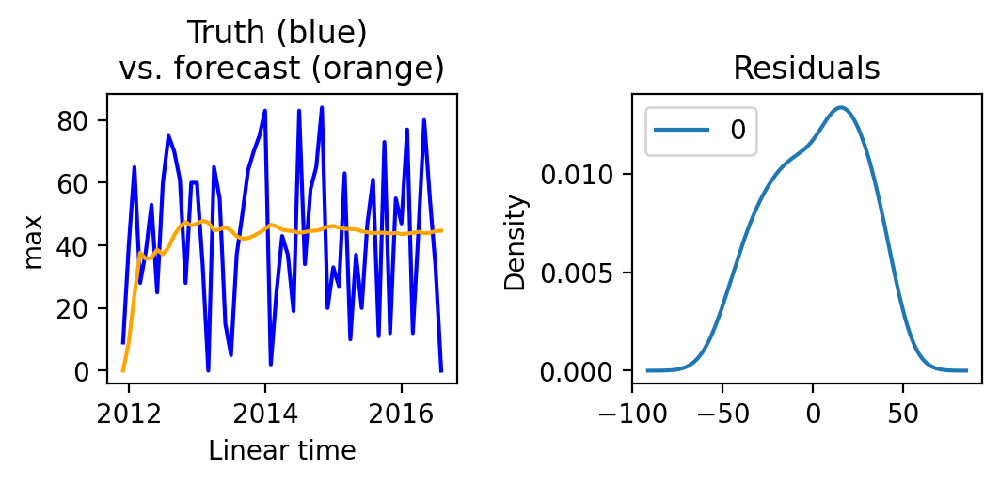

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -259.849
Date:                Thu, 18 May 2023   AIC                            525.699
Time:                        21:33:16   BIC                            531.775
Sample:                             0   HQIC                           528.054
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0145      0.156     -0.092      0.926      -0.321       0.292
ma.L1         -0.9993      7.130     -0.140      0.889     -14.975      12.976
sigma2       584.2811   4143.634      0.141      0.8

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict

plt.rcParams["figure.figsize"] = [6.0,2.0]
plt.rcParams["figure.dpi"] = 200

interesting_variable_combinations = [
    ["Asparagopsis armata","Medium",param,1],
    ["Cladophora sp. (limo)","Medium",param,2],
    ["Cladophora sp. (limo)","Supra",param,1],
    ["Colpomenia sinuosa (alga bolhas)","Medium",param,2],
    ["Coralina elongata","Medium",param,1],
    ["Chthamalus sp.","Medium",param,1],
    ["Chthamalus sp.","Supra",param,1],
]

df_agg_exogenous = pd.merge(
    df_agg,nasa_data_df,on=["Year","Month"])

models = {"arima":{}}

for comb in interesting_variable_combinations:
    print(comb)
    tmp = df_agg.loc[(df_agg.loc[:,"variable"] == comb[0]) 
                     * (df_agg.loc[:,"tide_cat"] == comb[1])]

    tmp = tmp.sort_values("Linear time")
    # identify largest contiguous series
    tmp = tmp.iloc[get_contiguous_idxs(tmp["Linear time"])]
    tmp.index = tmp["Linear time"]

    # order specifies (lag, differences, moving average)
    arima_model = ARIMA(endog=tmp[comb[2]],order=(comb[-1],1,1))
        
    model_fit = arima_model.fit()
    models["arima"][comb[0],comb[1]] = model_fit
    
    residuals = pd.DataFrame(model_fit.resid)

    fig,ax = plt.subplots(1,2)
    sns.lineplot(tmp[comb[2]],color="blue",ax=ax[0])
    sns.lineplot(model_fit.predict(),color="orange",ax=ax[0])
    # residuals plot
    residuals.plot(kind='kde',ax=ax[1])
    ax[0].set_title("Truth (blue) \nvs. forecast (orange)")
    ax[1].set_title("Residuals")
    plt.subplots_adjust(wspace=0.5)
    plt.show()

    # summary of fit model
    print(model_fit.summary())

### 6. Forecasting with Seasonality (ARIMA->SARIMA)

Given that ARIMA appears to miss some of the variation, we repeat the above and consider an additional seasonal process. Visually, we can tell there is marked improvement, implying that there is a seasonal component which can be captured through relatively simple modelling assumptions (a seasonal term with order=12, one for each month).

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


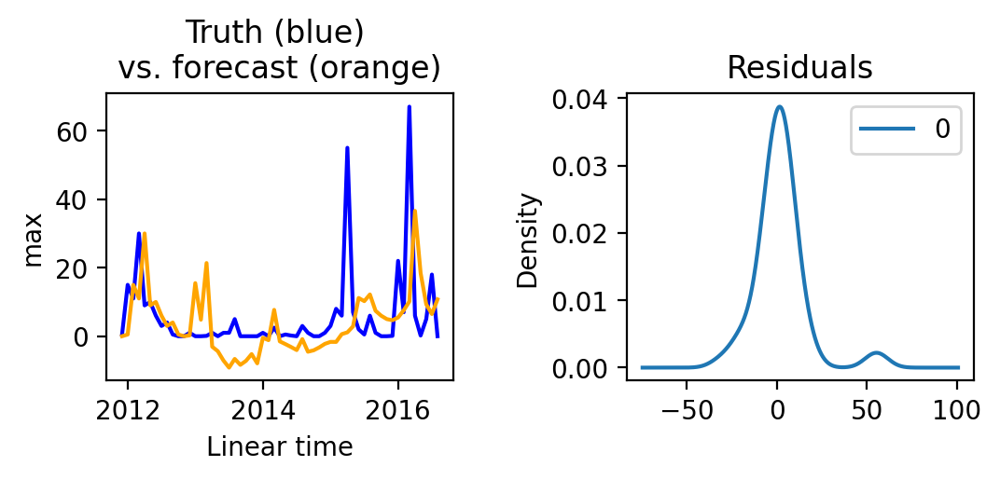

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -182.692
Date:                           Thu, 18 May 2023   AIC                            373.383
Time:                                   21:33:25   BIC                            380.520
Sample:                                        0   HQIC                           376.030
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1520      0.221     -0.688      0.491      -0.585       0.281
ma.L1         -0.8234      0.163     -5.051

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


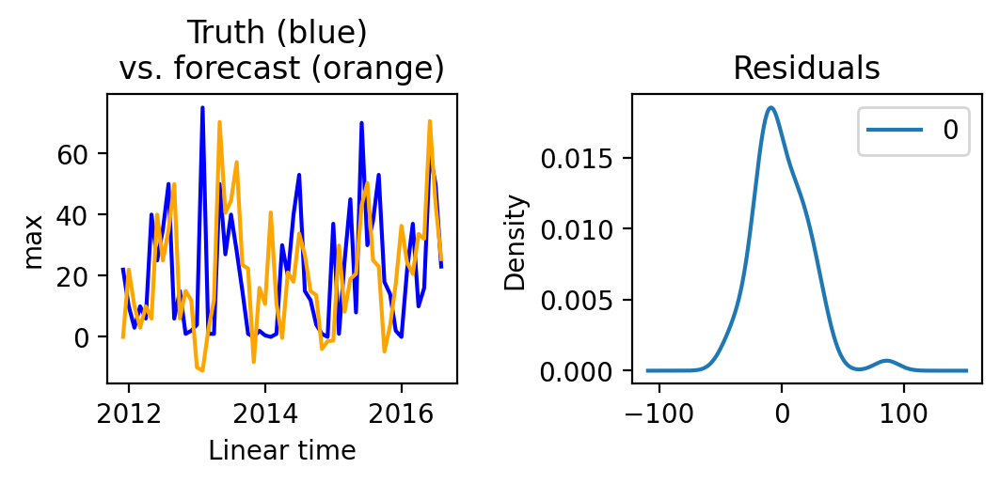

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                -196.870
Date:                           Thu, 18 May 2023   AIC                            403.740
Time:                                   21:33:25   BIC                            412.660
Sample:                                        0   HQIC                           407.048
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5467      0.213     -2.568      0.010      -0.964      -0.129
ar.L2         -0.3797      0.173     -2.194

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


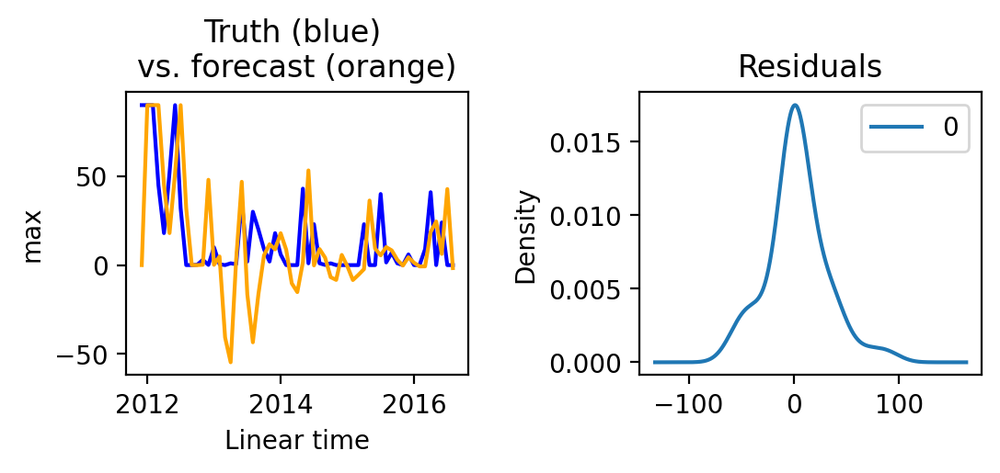

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -201.515
Date:                           Thu, 18 May 2023   AIC                            411.030
Time:                                   21:33:26   BIC                            418.167
Sample:                                        0   HQIC                           413.677
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2027      0.383     -0.529      0.597      -0.953       0.548
ma.L1         -0.4650      0.365     -1.273

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


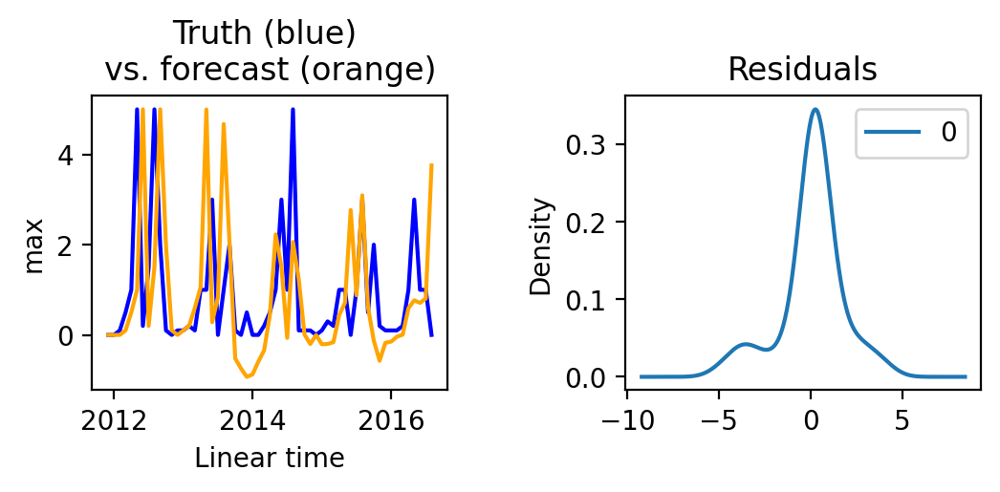

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                 -78.015
Date:                           Thu, 18 May 2023   AIC                            166.031
Time:                                   21:33:27   BIC                            174.952
Sample:                                        0   HQIC                           169.339
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2113      0.193     -1.094      0.274      -0.590       0.167
ar.L2         -0.0677      0.161     -0.420

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


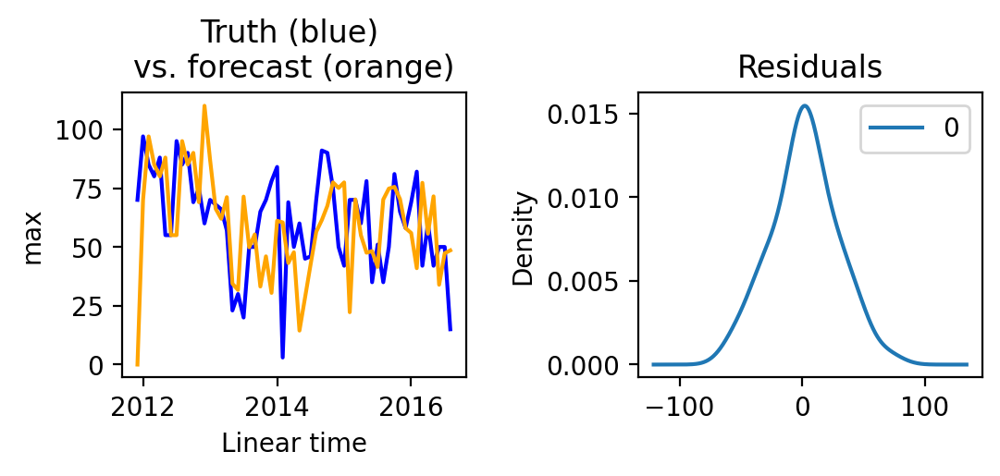

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -205.221
Date:                           Thu, 18 May 2023   AIC                            418.442
Time:                                   21:33:27   BIC                            425.579
Sample:                                        0   HQIC                           421.089
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0115      0.204      0.056      0.955      -0.388       0.411
ma.L1         -0.7989      0.132     -6.067

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


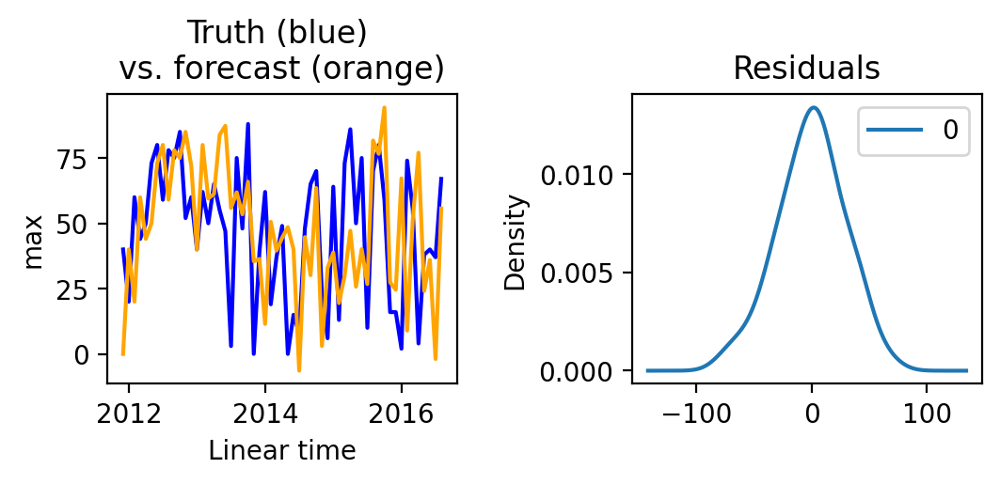

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -213.060
Date:                           Thu, 18 May 2023   AIC                            434.120
Time:                                   21:33:28   BIC                            441.257
Sample:                                        0   HQIC                           436.767
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1841      0.336     -0.547      0.584      -0.843       0.475
ma.L1         -0.6765      0.231     -2.934

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


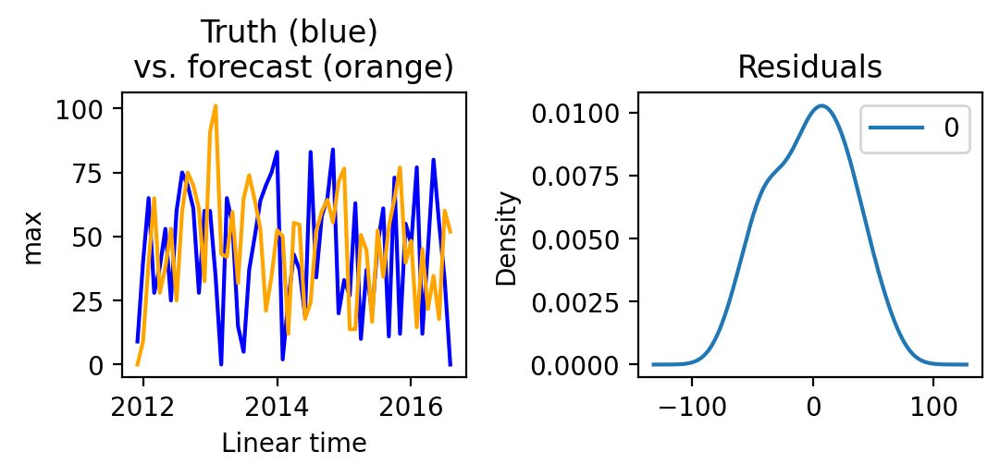

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -218.934
Date:                           Thu, 18 May 2023   AIC                            445.868
Time:                                   21:33:28   BIC                            453.005
Sample:                                        0   HQIC                           448.515
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0379      0.177     -0.214      0.831      -0.385       0.310
ma.L1         -0.9985      6.100     -0.164

In [ ]:
models["sarima"] = {}

seasonal_order = (1,1,0,12)

for comb in interesting_variable_combinations:
    tmp = df_agg.loc[(df_agg.loc[:,"variable"] == comb[0]) 
                     * (df_agg.loc[:,"tide_cat"] == comb[1])]

    tmp = tmp.sort_values("Linear time")
    # identify largest contiguous series
    tmp = tmp.iloc[get_contiguous_idxs(tmp["Linear time"])]
    tmp.index = tmp["Linear time"]

    # order specifies (lag, differences, )
    arima_model = ARIMA(endog=tmp[comb[2]],order=(comb[-1],1,1),
                        seasonal_order=seasonal_order)
        
    model_fit = arima_model.fit()
    
    models["sarima"][comb[0],comb[1]] = model_fit
    
    residuals = pd.DataFrame(model_fit.resid)

    fig,ax = plt.subplots(1,2)
    sns.lineplot(tmp[comb[2]],color="blue",ax=ax[0])
    sns.lineplot(model_fit.predict(),color="orange",ax=ax[0])
    # residuals plot
    residuals.plot(kind='kde',ax=ax[1])
    ax[0].set_title("Truth (blue) \nvs. forecast (orange)")
    ax[1].set_title("Residuals")
    plt.subplots_adjust(wspace=0.5)
    plt.show()

    # summary of fit model
    print(model_fit.summary())

### 7. Including Exogenous Variables (SARIMA -> SARIMAX)

SARIMAX allows us to extend our analyses and include exogenous variables. Here, we use variables from NASA (NO2, CO, chlorophyll) and the water temperature from the AMPA dataset.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


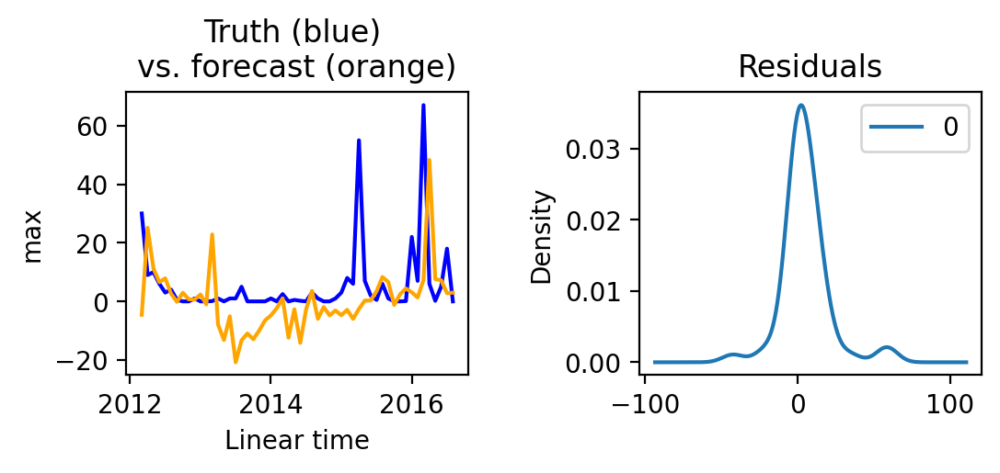

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -176.093
Date:                           Thu, 18 May 2023   AIC                            368.187
Time:                                   21:33:43   BIC                            381.895
Sample:                                        0   HQIC                           373.179
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0081      0.108     -0.075      0.940      -0.220       0.204
MOP_CO_M      -6.141e-05      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


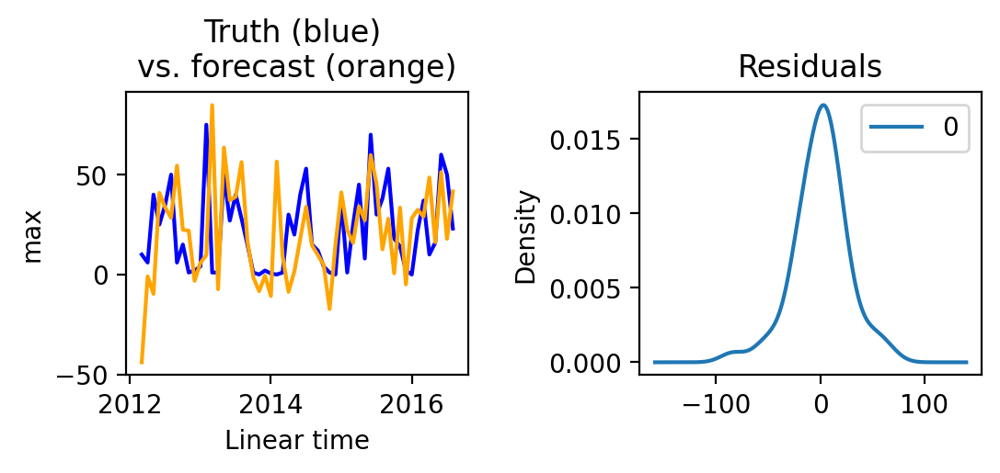

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                -180.166
Date:                           Thu, 18 May 2023   AIC                            378.332
Time:                                   21:33:44   BIC                            393.754
Sample:                                        0   HQIC                           383.948
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M        0.1076      0.039      2.727      0.006       0.030       0.185
MOP_CO_M          0.0003      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


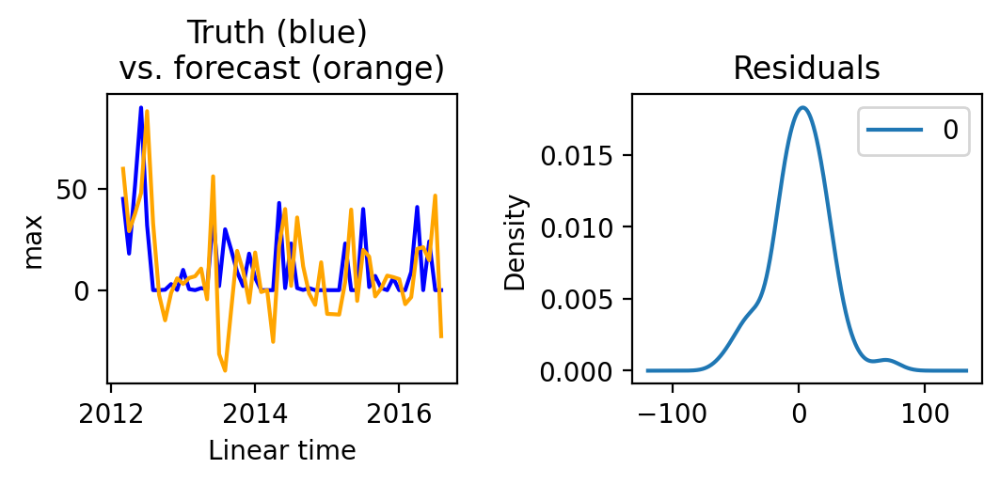

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -185.215
Date:                           Thu, 18 May 2023   AIC                            386.430
Time:                                   21:33:45   BIC                            400.138
Sample:                                        0   HQIC                           391.422
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M        0.0117      0.078      0.149      0.881      -0.141       0.165
MOP_CO_M         -0.0001      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


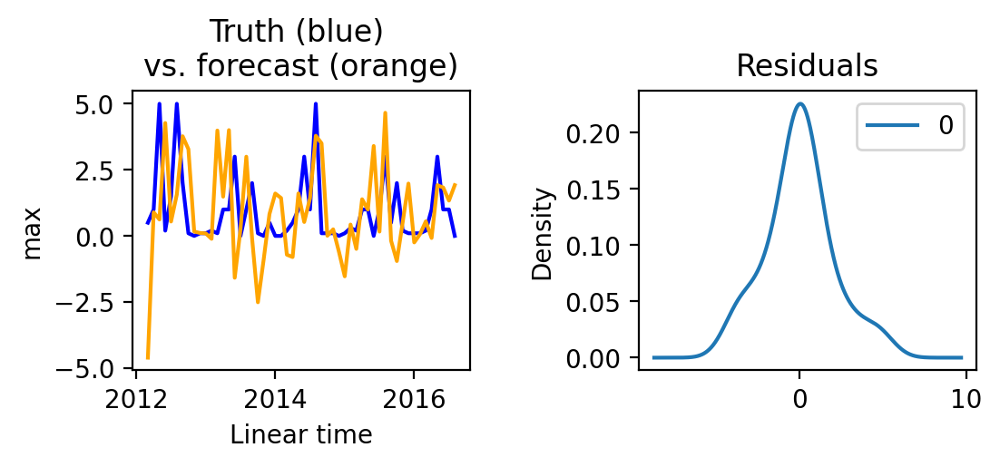

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                 -78.917
Date:                           Thu, 18 May 2023   AIC                            175.834
Time:                                   21:33:46   BIC                            191.256
Sample:                                        0   HQIC                           181.450
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0081      0.003     -2.445      0.014      -0.015      -0.002
MOP_CO_M       5.912e-06   7.43e-0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


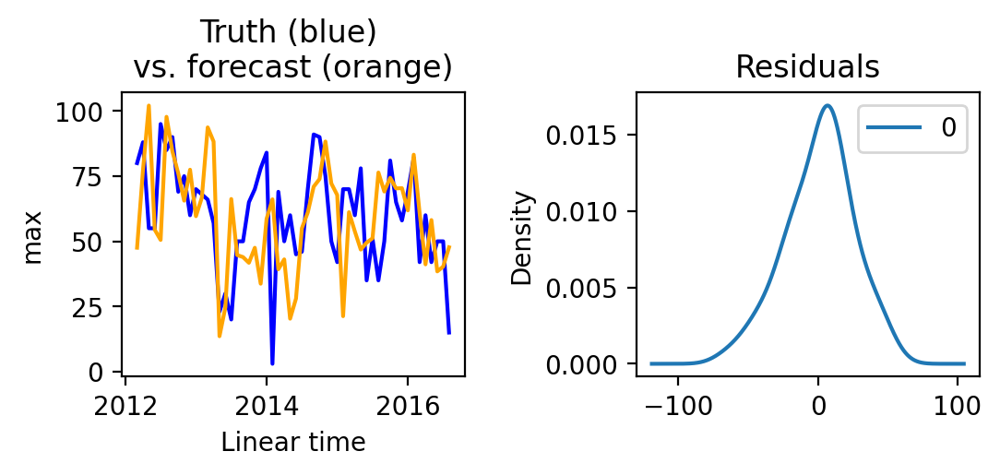

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -190.273
Date:                           Thu, 18 May 2023   AIC                            396.547
Time:                                   21:33:47   BIC                            410.255
Sample:                                        0   HQIC                           401.539
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0218      0.105     -0.207      0.836      -0.228       0.185
MOP_CO_M          0.0005      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


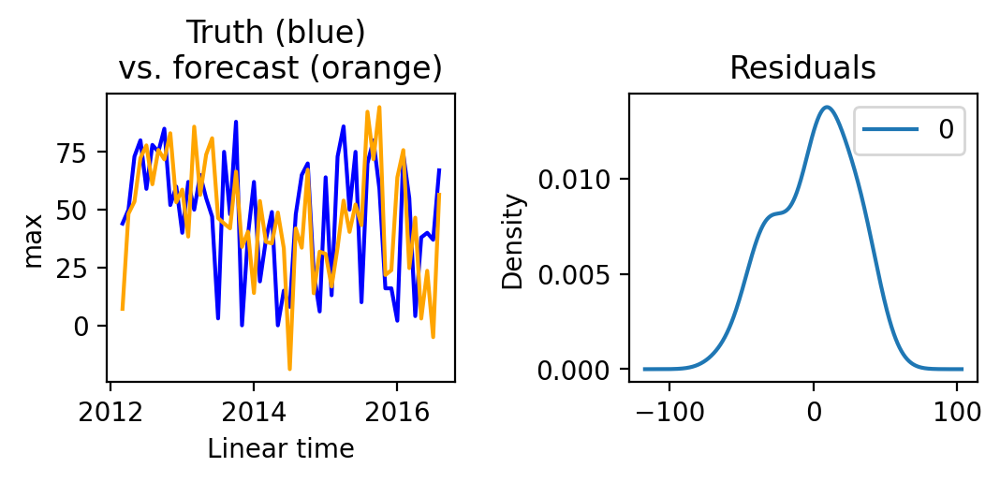

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -195.385
Date:                           Thu, 18 May 2023   AIC                            406.770
Time:                                   21:33:48   BIC                            420.478
Sample:                                        0   HQIC                           411.761
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0387      0.075     -0.514      0.607      -0.186       0.109
MOP_CO_M          0.0008      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

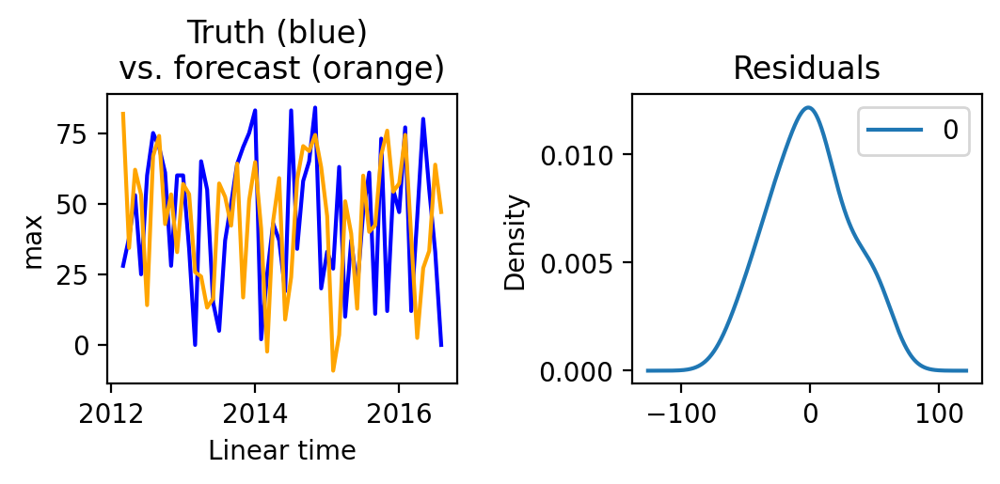

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -201.000
Date:                           Thu, 18 May 2023   AIC                            418.001
Time:                                   21:33:49   BIC                            431.709
Sample:                                        0   HQIC                           422.993
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0842      0.121     -0.698      0.485      -0.320       0.152
MOP_CO_M          0.0005      0.00

In [ ]:
models["sarimax"] = {}

exog_cols_1 = [x for x in nasa_data_df.columns[3:-1]] + ["Temperature"]

for comb in interesting_variable_combinations:
    tmp = df_agg_exogenous.loc[(df_agg.loc[:,"variable"] == comb[0]) 
                     * (df_agg.loc[:,"tide_cat"] == comb[1])]

    tmp = tmp.sort_values("Linear time")
    # identify largest contiguous series
    tmp = tmp.iloc[get_contiguous_idxs(tmp["Linear time"])]
    tmp.index = tmp["Linear time"]

    # order specifies (lag, differences, )
    arima_model = ARIMA(
        endog=tmp[comb[2]],order=(comb[-1],1,1),
        seasonal_order=seasonal_order,
        exog=tmp[exog_cols_1])
        
    model_fit = arima_model.fit()
    
    models["sarimax"][comb[0],comb[1]] = model_fit
    
    residuals = pd.DataFrame(model_fit.resid)

    fig,ax = plt.subplots(1,2)
    sns.lineplot(tmp[comb[2]],color="blue",ax=ax[0])
    sns.lineplot(model_fit.predict(),color="orange",ax=ax[0])
    # residuals plot
    residuals.plot(kind='kde',ax=ax[1])
    ax[0].set_title("Truth (blue) \nvs. forecast (orange)")
    ax[1].set_title("Residuals")
    plt.subplots_adjust(wspace=0.5)
    plt.show()

    # summary of fit model
    print(model_fit.summary())

### 8. Including exogenous variables and other species (SARIMA -> SARIMAX)

We have identified through a correlation analysis that *Ulva rigida* and *Gigartina sp.* are associated with *Cladophora sp.*. For this reason, we would like to understand how these associations may influence the modelling of *Cladophora sp.*. To do so, we include the maximum of *Ulva rigida* and *Gigartina sp.* at a given time as separate features.
This would be interesting as it would allow us to extend our modelling to quantify the impact of local species on invasive species - this could direct conservation efforts that focus on repopulating native sessile species as a strategy to hinder the appearance of *Cladophora sp.* species. However, as seen below and despite the positive correlation, this does not appear improve our SARIMAX estimates.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


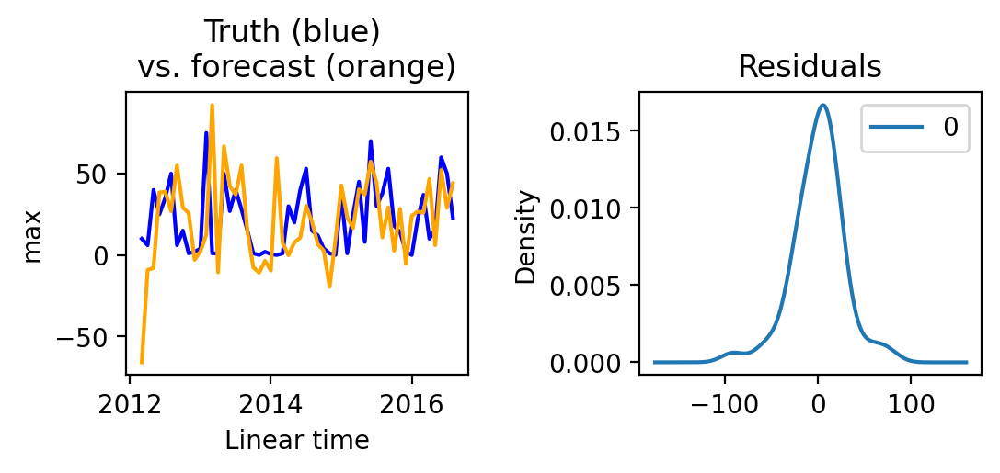

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                -180.587
Date:                           Thu, 18 May 2023   AIC                            383.174
Time:                                   21:33:59   BIC                            402.024
Sample:                                        0   HQIC                           390.038
                                            - 54                                         
Covariance Type:                             opg                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
AURA_NO2_M                          0.1131      0.072      1.564      0.118     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


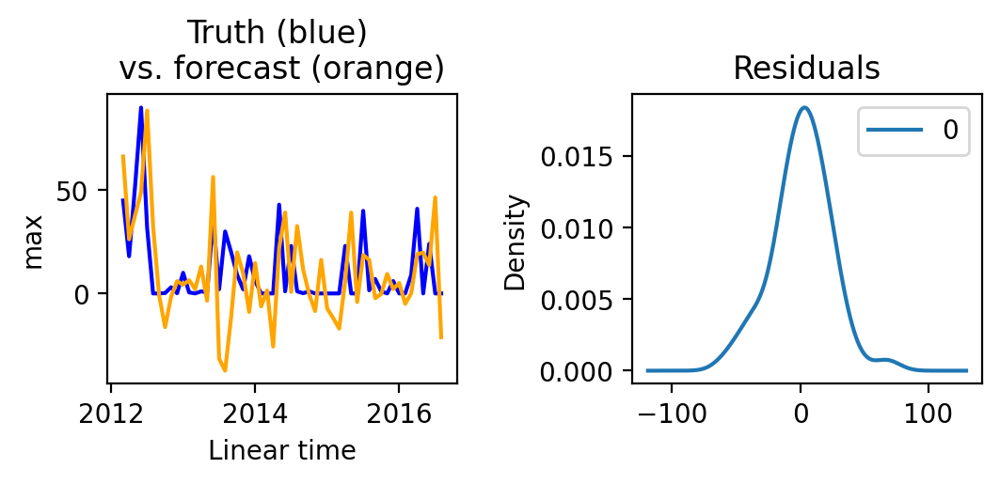

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -184.903
Date:                           Thu, 18 May 2023   AIC                            389.806
Time:                                   21:34:00   BIC                            406.942
Sample:                                        0   HQIC                           396.046
                                            - 54                                         
Covariance Type:                             opg                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
AURA_NO2_M                          0.0331      0.080      0.413      0.680     

In [ ]:
models["sarimax_species"] = {}

interesting_variable_combinations_with_species = [
    ["Cladophora sp. (limo)","Medium",param,2],
    ["Cladophora sp. (limo)","Supra",param,1],
]

exog_cols_species = [x for x in nasa_data_df.columns[3:-1]] + ["Temperature"] + other_species_exogenous

for comb in interesting_variable_combinations_with_species:
    tmp = df_agg_exogenous.loc[(df_agg.loc[:,"variable"] == comb[0]) 
                     * (df_agg.loc[:,"tide_cat"] == comb[1])]

    tmp = tmp.sort_values("Linear time")
    # identify largest contiguous series
    for k in other_species_exogenous:
        tmp[k] = np.concatenate([tmp[k].iloc[1:],[np.nan]])
    tmp = tmp.iloc[get_contiguous_idxs(tmp["Linear time"])]
    tmp.index = tmp["Linear time"]

    # order specifies (lag, differences, )
    arima_model = ARIMA(
        endog=tmp[comb[2]],order=(comb[-1],1,1),
        seasonal_order=seasonal_order,
        exog=tmp[exog_cols_species])
        
    model_fit = arima_model.fit()
    
    models["sarimax_species"][comb[0],comb[1]] = model_fit
    
    residuals = pd.DataFrame(model_fit.resid)

    fig,ax = plt.subplots(1,2)
    sns.lineplot(tmp[comb[2]],color="blue",ax=ax[0])
    sns.lineplot(model_fit.predict(),color="orange",ax=ax[0])
    # residuals plot
    residuals.plot(kind='kde',ax=ax[1])
    ax[0].set_title("Truth (blue) \nvs. forecast (orange)")
    ax[1].set_title("Residuals")
    plt.subplots_adjust(wspace=0.5)
    plt.show()

    # summary of fit model
    print(model_fit.summary())

### 9. Result Analysis

In all seven scenarios examined, the SARIMAX model consistently exhibited lower Akaike Information Criterion (AIC) values compared to the baseline model (ARIMA). This consistent superiority of the SARIMAX model suggests that incorporating exogenous variables can serve as a favorable approach for addressing this specific problem. 

We can now see the relevant coefficients below for the three analyses that detected how exogenous variables affect species coverage.

In [ ]:
print('Cladophora sp. (limo)', 'Medium')
models["sarimax"]['Cladophora sp. (limo)', 'Medium'].summary().tables[1]

Cladophora sp. (limo) Medium


,coef,std err,z,P>|z|,[0.025,0.975]
AURA_NO2_M,0.1076,0.039,2.727,0.006,0.030,0.185
MOP_CO_M,0.0003,0.000,0.892,0.373,-0.000,0.001
MY1DMM_CHLORA,-2.7441,1.603,-1.712,0.087,-5.885,0.397
Temperature,-3.3735,1.818,-1.855,0.064,-6.938,0.191
ar.L1,-0.7303,0.334,-2.189,0.029,-1.384,-0.076
ar.L2,-0.3475,0.256,-1.355,0.175,-0.850,0.155
ma.L1,-0.3778,0.311,-1.215,0.224,-0.987,0.232
ar.S.L12,0.0806,0.270,0.298,0.765,-0.449,0.610
sigma2,428.0839,154.181,2.776,0.005,125.894,730.274


In [ ]:
print('Cladophora sp. (limo)', 'Supra')
models["sarimax"]['Cladophora sp. (limo)', 'Supra'].summary().tables[1]

Cladophora sp. (limo) Supra


,coef,std err,z,P>|z|,[0.025,0.975]
AURA_NO2_M,0.0117,0.078,0.149,0.881,-0.141,0.165
MOP_CO_M,-0.0001,0.001,-0.204,0.838,-0.001,0.001
MY1DMM_CHLORA,4.3979,1.942,2.265,0.024,0.591,8.204
Temperature,1.9166,3.589,0.534,0.593,-5.119,8.952
ar.L1,0.1726,0.446,0.387,0.699,-0.702,1.048
ma.L1,-0.6607,0.421,-1.568,0.117,-1.486,0.165
ar.S.L12,-0.0929,0.181,-0.514,0.607,-0.447,0.261
sigma2,525.3893,156.875,3.349,0.001,217.920,832.859


In [ ]:
print('Colpomenia sinuosa (alga bolhas)', 'Medium')
models["sarimax"]['Colpomenia sinuosa (alga bolhas)', 'Medium'].summary().tables[1]

Colpomenia sinuosa (alga bolhas) Medium


,coef,std err,z,P>|z|,[0.025,0.975]
AURA_NO2_M,-0.0081,0.003,-2.445,0.014,-0.015,-0.002
MOP_CO_M,5.912e-06,7.43e-05,0.080,0.937,-0.000,0.000
MY1DMM_CHLORA,0.2748,0.097,2.829,0.005,0.084,0.465
Temperature,-0.2759,0.140,-1.973,0.048,-0.550,-0.002
ar.L1,0.2101,0.816,0.257,0.797,-1.390,1.810
ar.L2,0.0402,0.326,0.123,0.902,-0.598,0.678
ma.L1,-0.5961,0.843,-0.707,0.480,-2.249,1.057
ar.S.L12,-0.1111,0.171,-0.648,0.517,-0.447,0.225
sigma2,2.3511,0.653,3.598,0.000,1.070,3.632


## 📑 Concluding remarks

A strong component of this analysis is that the data is relatively sparse and does not allow for a profound analysis. Furthermore, it should be noted that in the publication accompanying this data, the only factors associated with variations in species density and Shannon-Wiener and Pielou indices are year and area of collection, with a single exception (Flora, middle-intertidal) where there was a significant difference in year. This highlights how temporal changes may be already hard to detect, even when looking at data "from afar". 

Nonetheless, we attempted to model these data - focusing particularly on invasive species - and uncover that the autoregressive component is relatively small and, in most instances, does not contribute predominantly to the modelling of the behaviour of these species. In other words, there does not appear to be an evident trend through the years that can be modelled to be better understood. We however uncover that specific invasive species have distinct associations with exogenous variables when controlling for auto-regressive aspects of the data:

* *Cladophora sp.* in the middle-intertidal zone is positively associated with **AURA_NO2_M**, a $\mathrm{NO_2}$ estimation from NASA
* *Cladophora sp.* in the supratidal zone is positively associated with **MY1DMM_CHLORA**, a chlorophyll estimation from NASA
* *Colpomenia sinuosa* in the middle-intertidal zone is negatively associated with **AURA_NO2_M** and **local water temperature**, while being positively associated with **MY1DMM_CHLORA**

We also attempted to model two non-invasive species, but were unsuccessful at uncovering relevant aspects of their dynamics.

These findings can better help us monitor how these invasive species evolve. The fact that our framework is based mostly on auto-regressive components and NASA readings allows us to easily transfer this analysis to other zones and species with similar readings. While we attempted to use the theoretically available air quality data from the Cascais municipality, the API is not functional (i.e. [here](http://opendata-cascais.qart.pt/lastmeasurements)).

## 🖼️ Visualisations

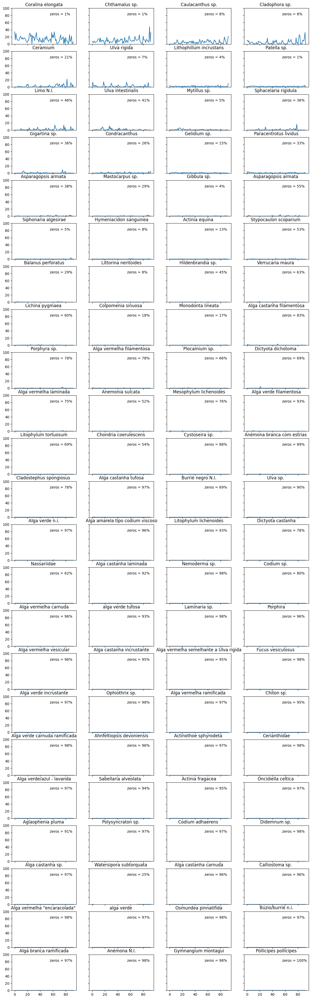

In [ ]:
### Plot sessile species

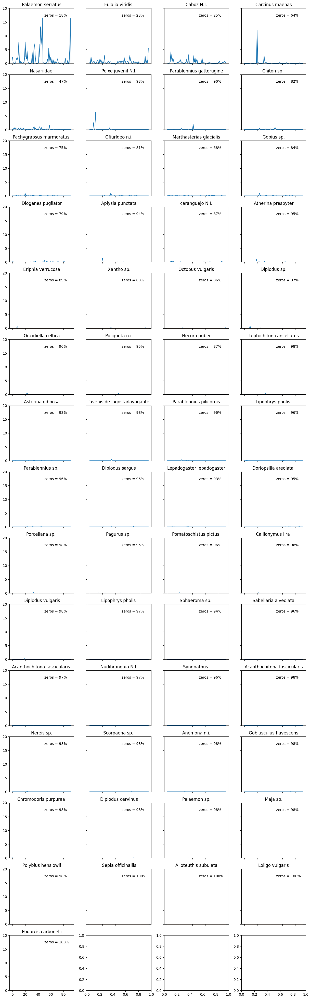

In [ ]:
### Plot mobile species

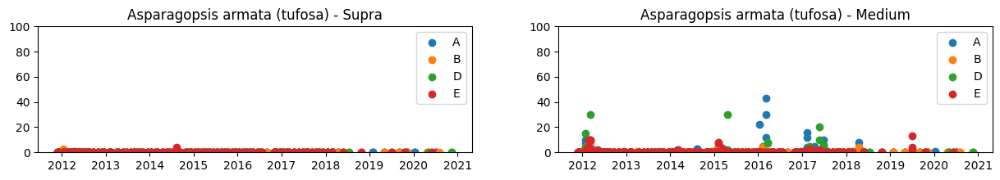

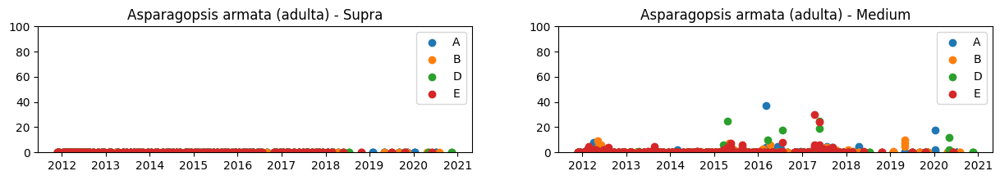

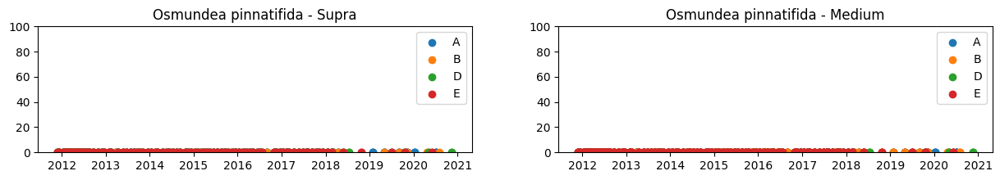

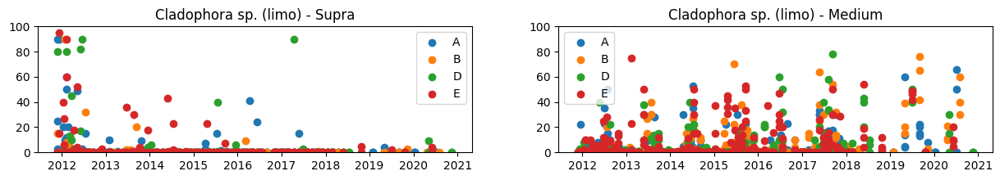

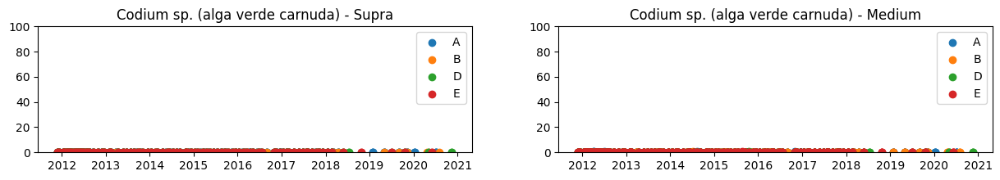

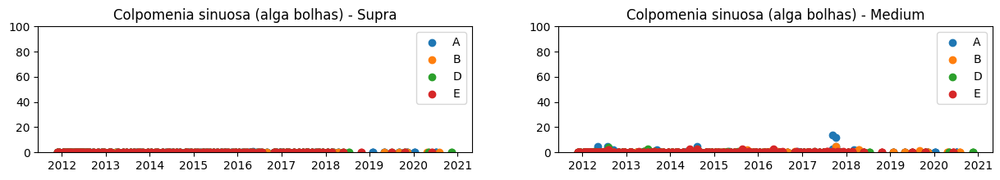

In [ ]:
### Plot invasive species

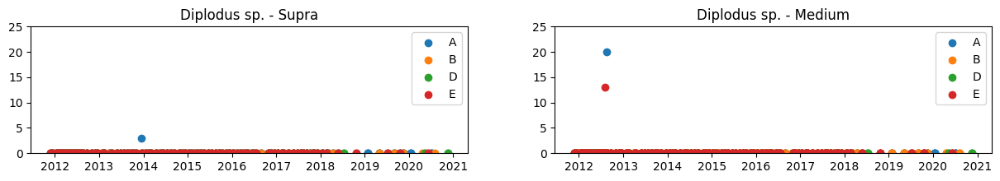

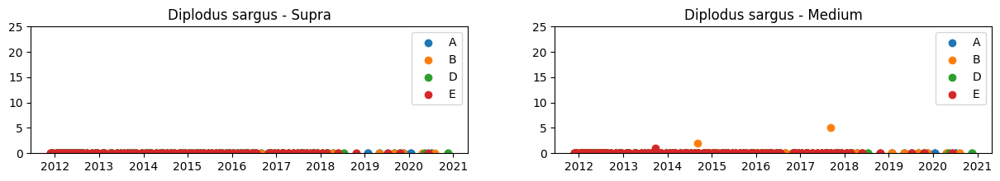

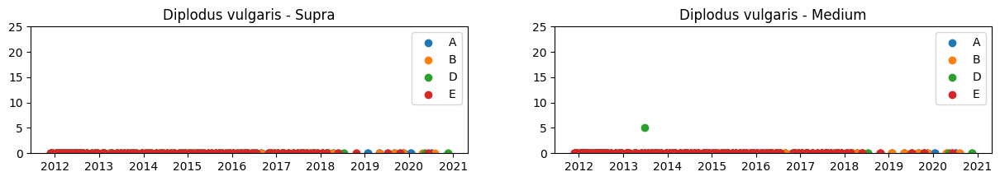

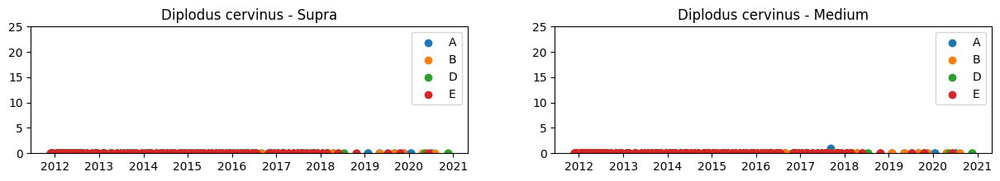

In [ ]:
# Plot commercially threatened species

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


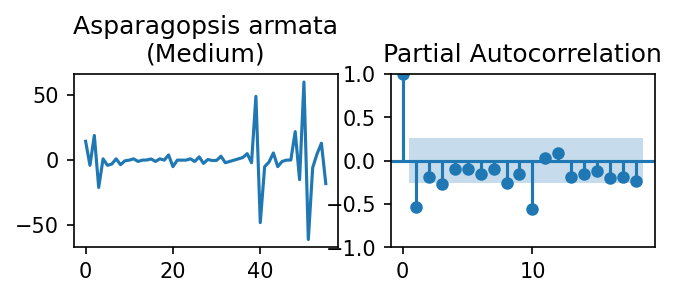

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


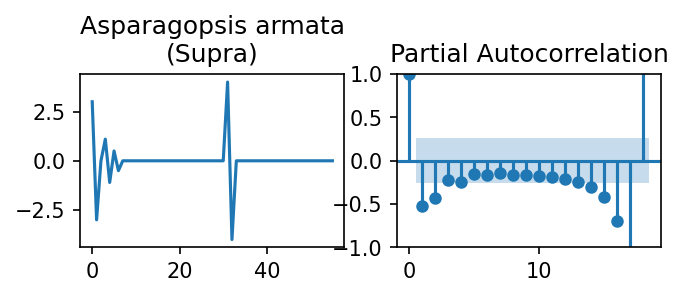

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


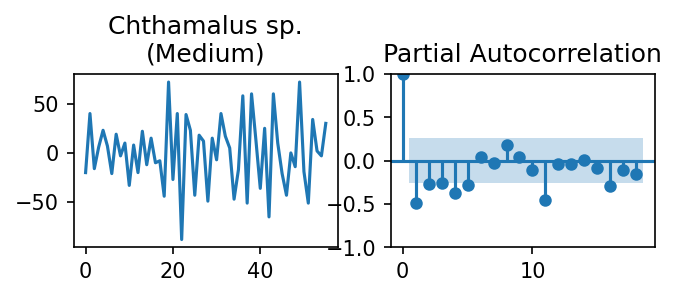

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


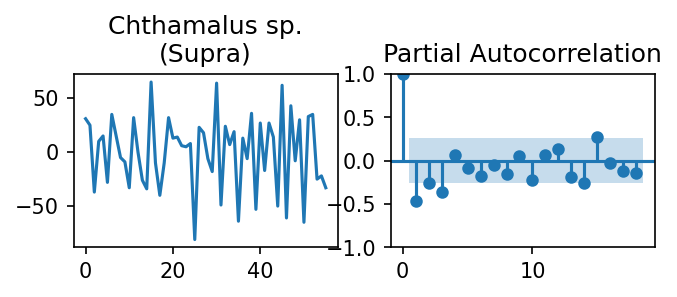

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


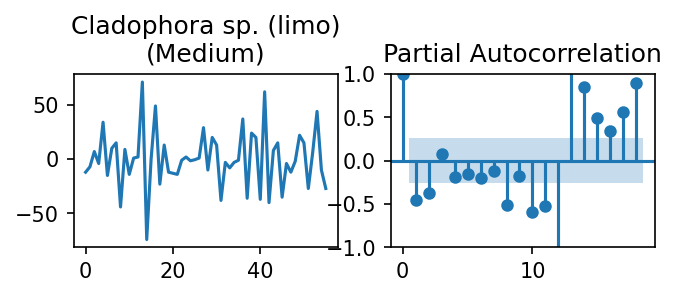

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


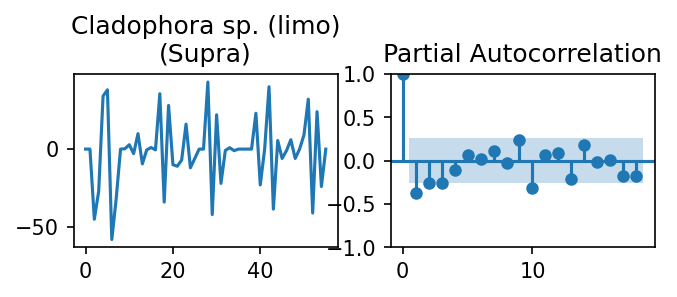

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


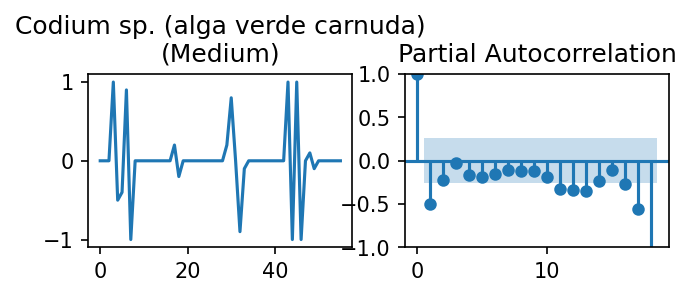

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


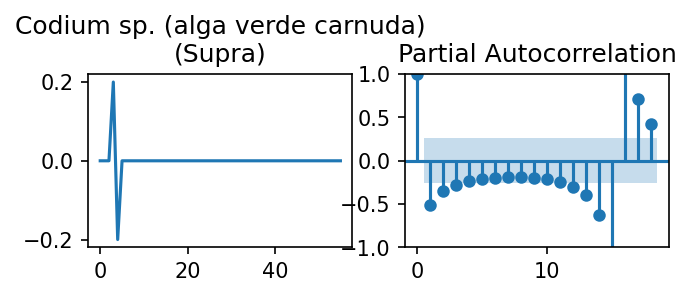

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


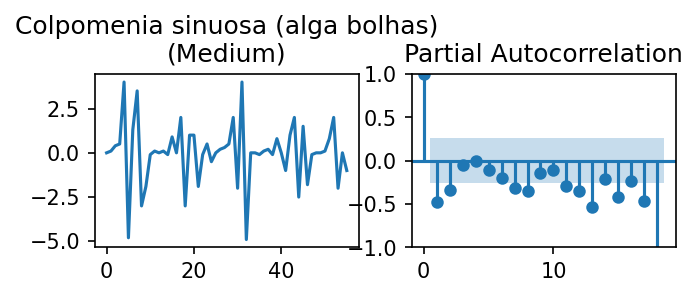

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


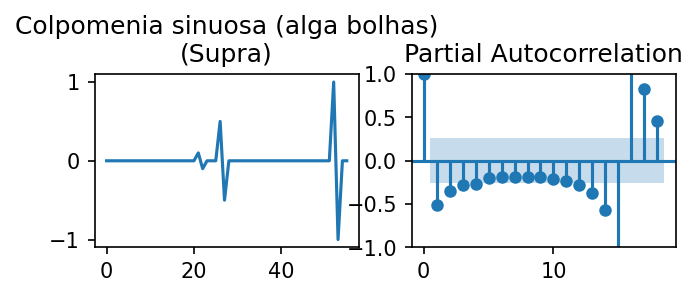

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


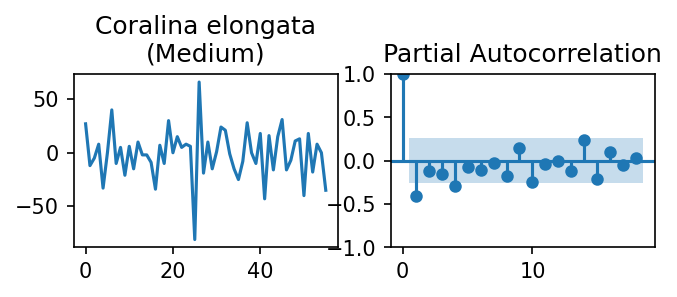

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


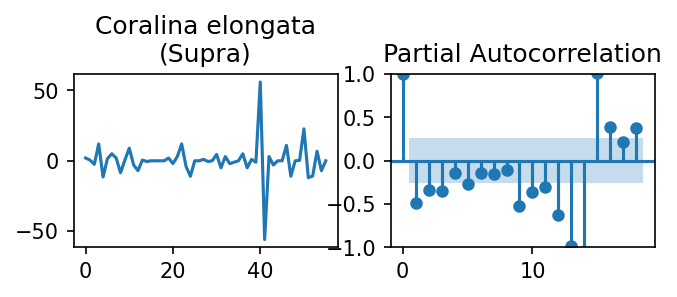

In [ ]:
# Plot correlations for parameter estimation (1)

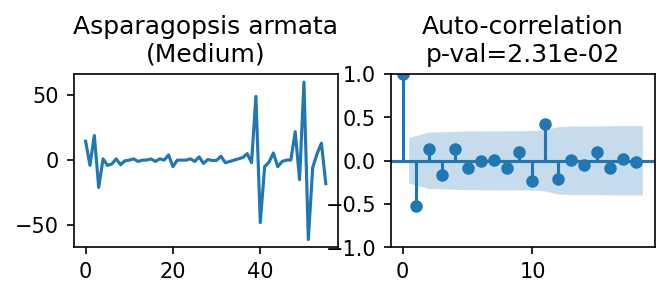

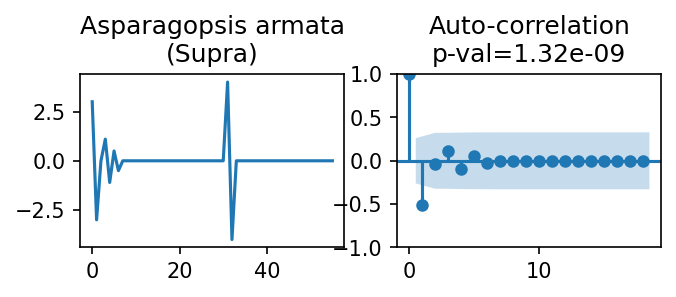

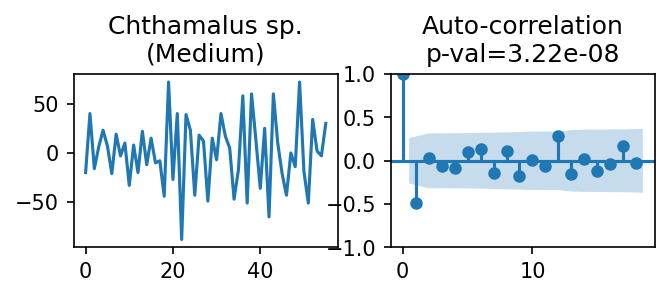

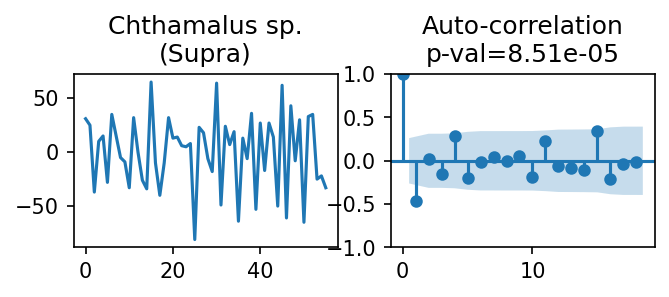

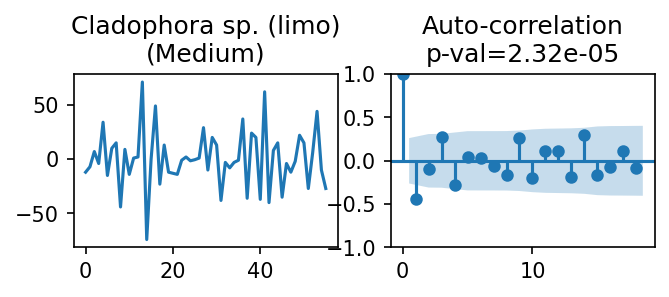

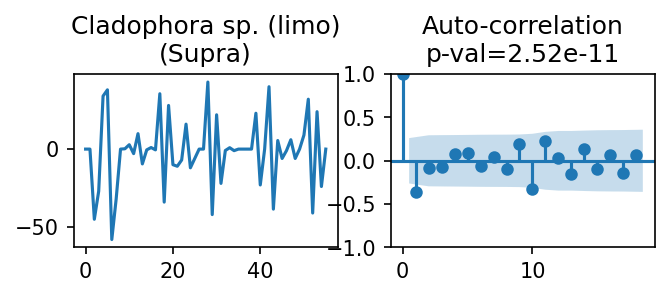

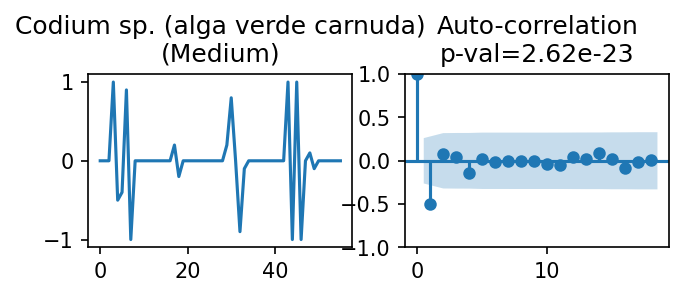

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:940: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


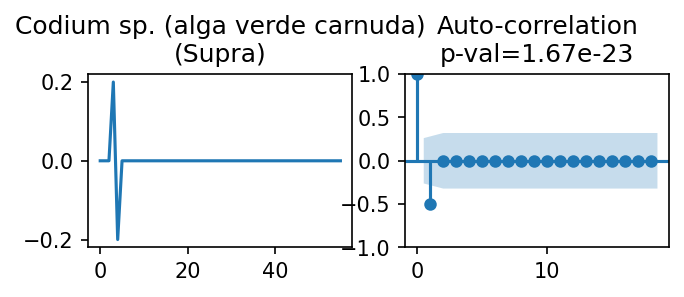

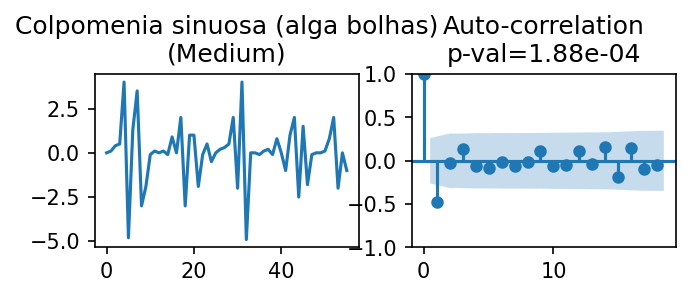

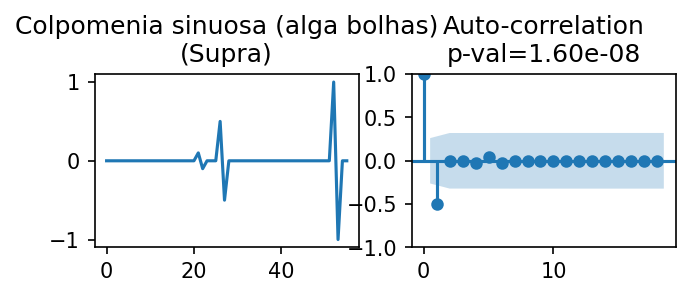

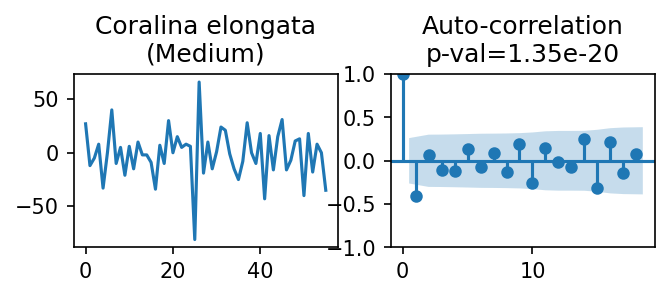

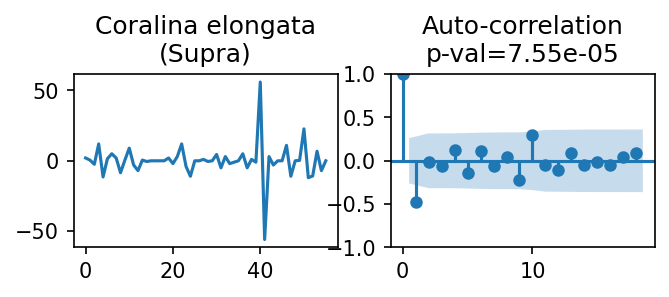

In [ ]:
# Plot correlations for parameter estimation (2)

['Asparagopsis armata', 'Medium', 'max', 1]


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


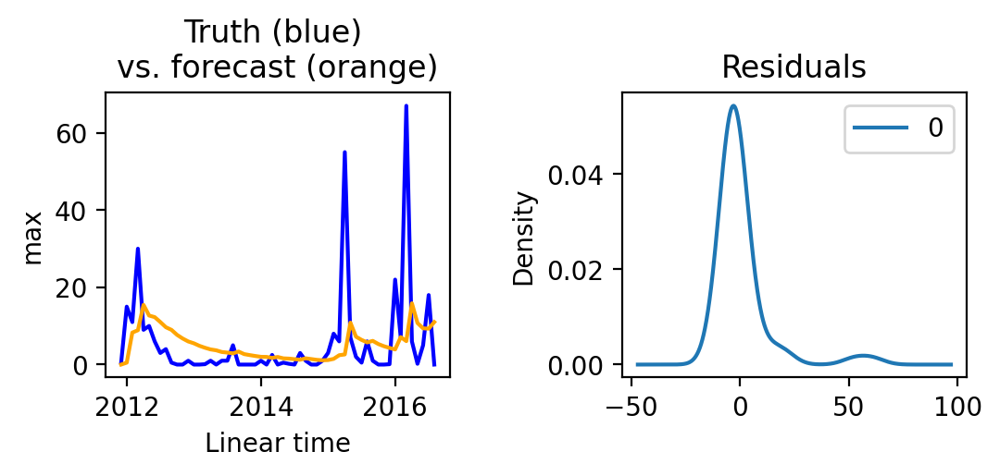

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -220.760
Date:                Thu, 18 May 2023   AIC                            447.519
Time:                        21:33:13   BIC                            453.596
Sample:                             0   HQIC                           449.875
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0685      0.247      0.277      0.782      -0.416       0.553
ma.L1         -0.9068      0.127     -7.162      0.000      -1.155      -0.659
sigma2       151.0716     11.844     12.755      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


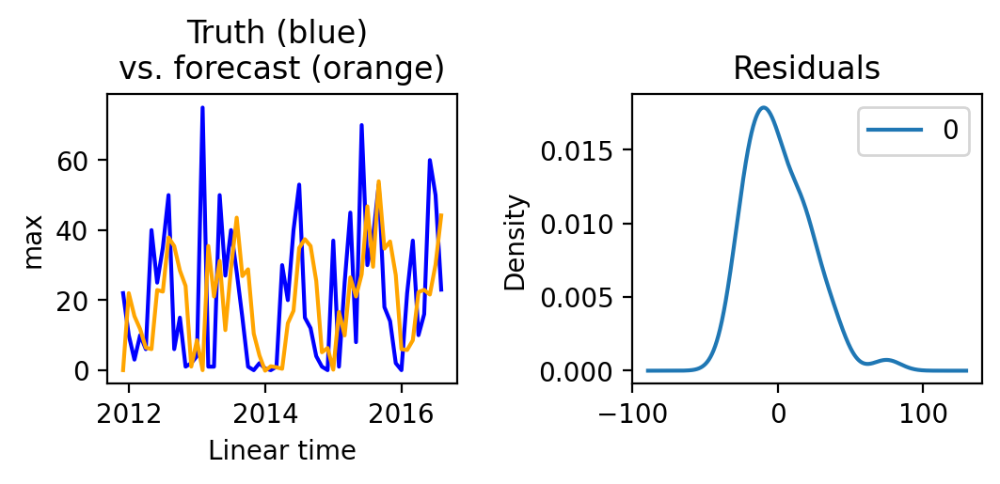

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -251.049
Date:                Thu, 18 May 2023   AIC                            510.099
Time:                        21:33:14   BIC                            518.200
Sample:                             0   HQIC                           513.240
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9264      0.277     -3.344      0.001      -1.469      -0.383
ar.L2         -0.5067      0.162     -3.136      0.002      -0.823      -0.190
ma.L1          0.3636      0.321      1.134      0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


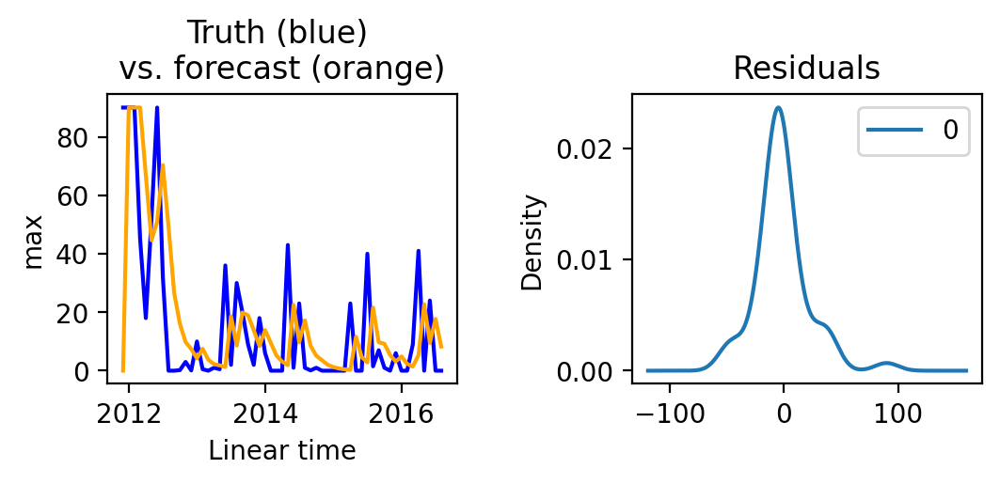

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -245.804
Date:                Thu, 18 May 2023   AIC                            497.608
Time:                        21:33:14   BIC                            503.684
Sample:                             0   HQIC                           499.964
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1021      0.211      0.484      0.629      -0.312       0.516
ma.L1         -0.6049      0.205     -2.953      0.003      -1.006      -0.203
sigma2       378.0242     67.201      5.625      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


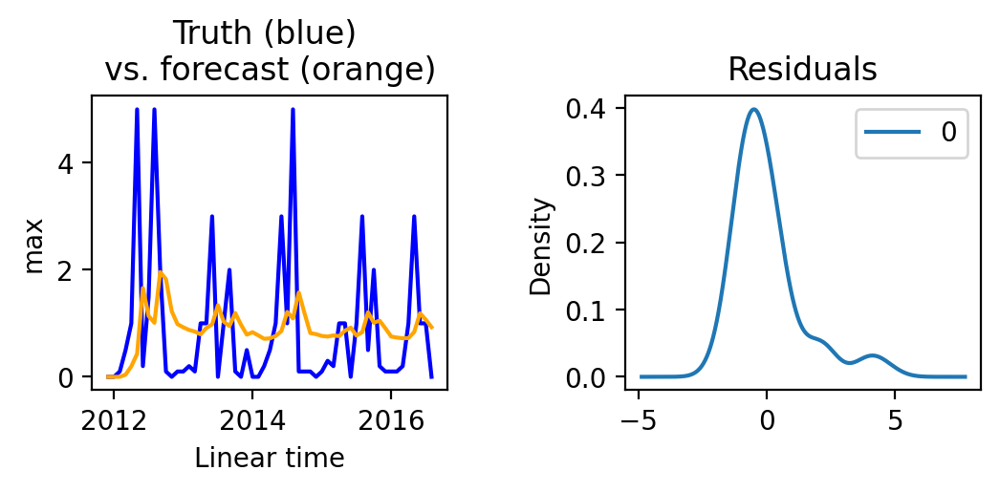

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(2, 1, 1)   Log Likelihood                 -94.921
Date:                Thu, 18 May 2023   AIC                            197.842
Time:                        21:33:15   BIC                            205.944
Sample:                             0   HQIC                           200.983
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1273      0.180      0.705      0.481      -0.226       0.481
ar.L2          0.0696      0.141      0.493      0.622      -0.207       0.346
ma.L1         -0.9995     14.057     -0.071      0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


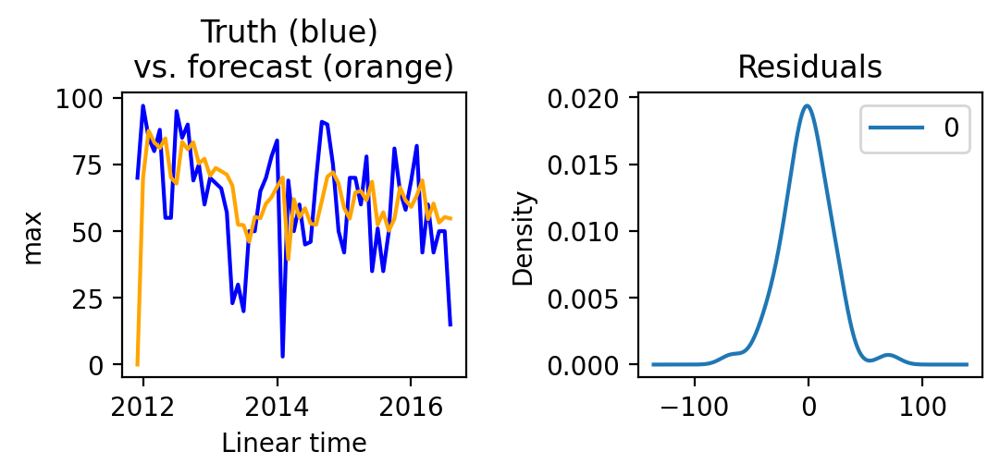

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -246.551
Date:                Thu, 18 May 2023   AIC                            499.101
Time:                        21:33:15   BIC                            505.177
Sample:                             0   HQIC                           501.457
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2975      0.179      1.666      0.096      -0.053       0.648
ma.L1         -0.9023      0.122     -7.398      0.000      -1.141      -0.663
sigma2       382.5919     70.895      5.397      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


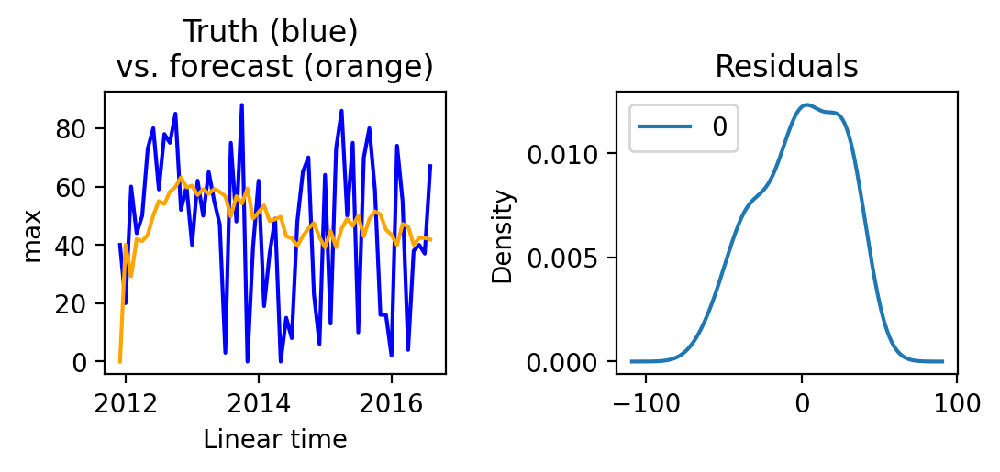

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -263.053
Date:                Thu, 18 May 2023   AIC                            532.105
Time:                        21:33:15   BIC                            538.181
Sample:                             0   HQIC                           534.461
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0718      0.149      0.484      0.629      -0.219       0.363
ma.L1         -0.9395      0.068    -13.840      0.000      -1.073      -0.806
sigma2       679.2724    167.915      4.045      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


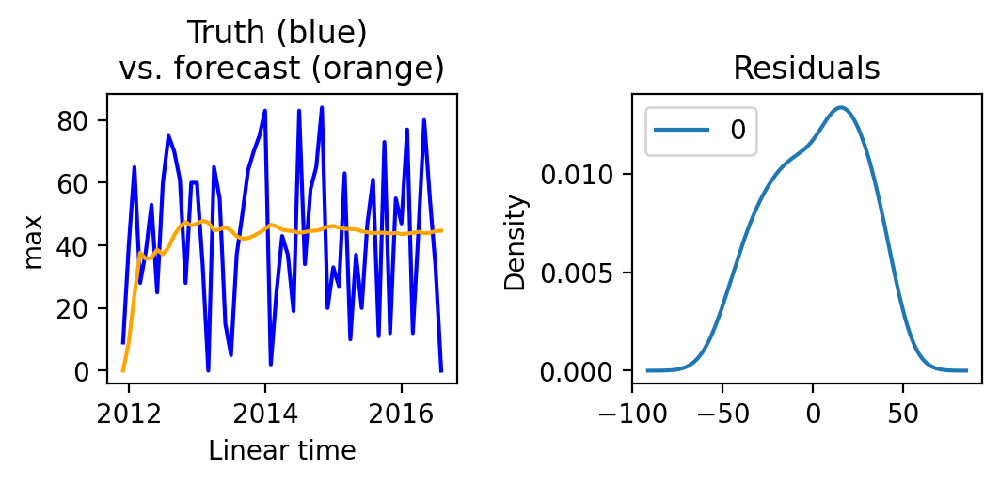

                               SARIMAX Results                                
Dep. Variable:                    max   No. Observations:                   57
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -259.849
Date:                Thu, 18 May 2023   AIC                            525.699
Time:                        21:33:16   BIC                            531.775
Sample:                             0   HQIC                           528.054
                                 - 57                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0145      0.156     -0.092      0.926      -0.321       0.292
ma.L1         -0.9993      7.130     -0.140      0.889     -14.975      12.976
sigma2       584.2811   4143.634      0.141      0.8

In [ ]:
# ARIMA plots

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


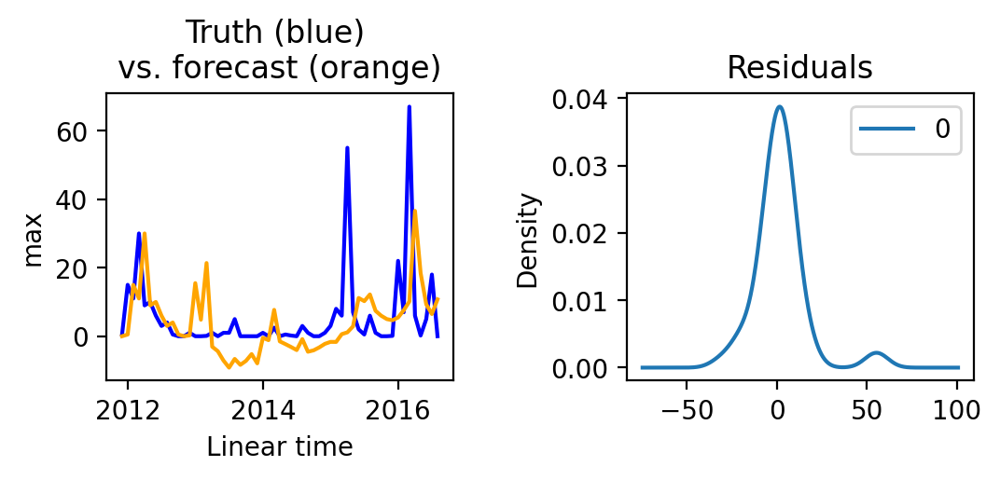

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -182.692
Date:                           Thu, 18 May 2023   AIC                            373.383
Time:                                   21:33:25   BIC                            380.520
Sample:                                        0   HQIC                           376.030
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1520      0.221     -0.688      0.491      -0.585       0.281
ma.L1         -0.8234      0.163     -5.051

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


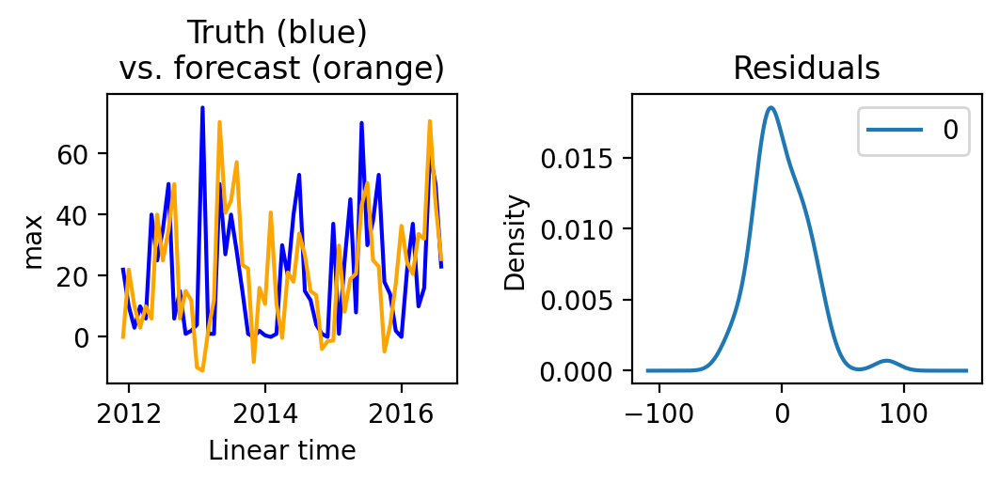

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                -196.870
Date:                           Thu, 18 May 2023   AIC                            403.740
Time:                                   21:33:25   BIC                            412.660
Sample:                                        0   HQIC                           407.048
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5467      0.213     -2.568      0.010      -0.964      -0.129
ar.L2         -0.3797      0.173     -2.194

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


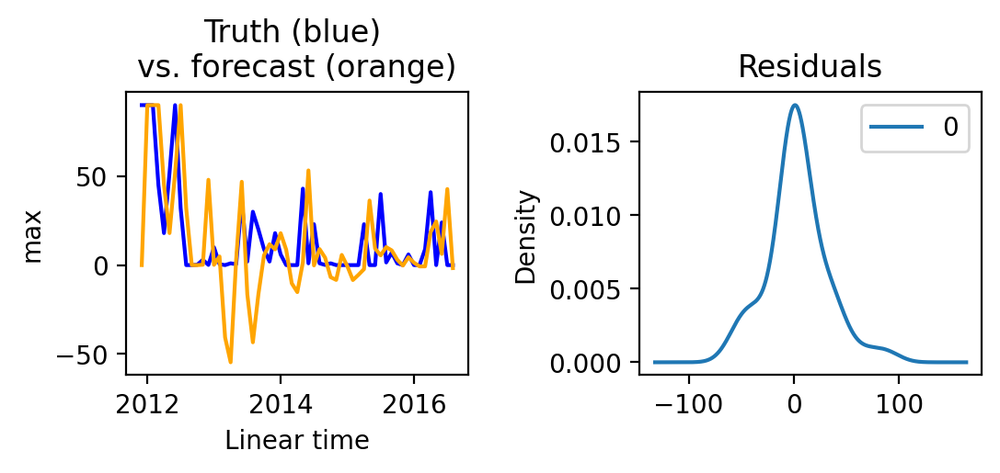

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -201.515
Date:                           Thu, 18 May 2023   AIC                            411.030
Time:                                   21:33:26   BIC                            418.167
Sample:                                        0   HQIC                           413.677
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2027      0.383     -0.529      0.597      -0.953       0.548
ma.L1         -0.4650      0.365     -1.273

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


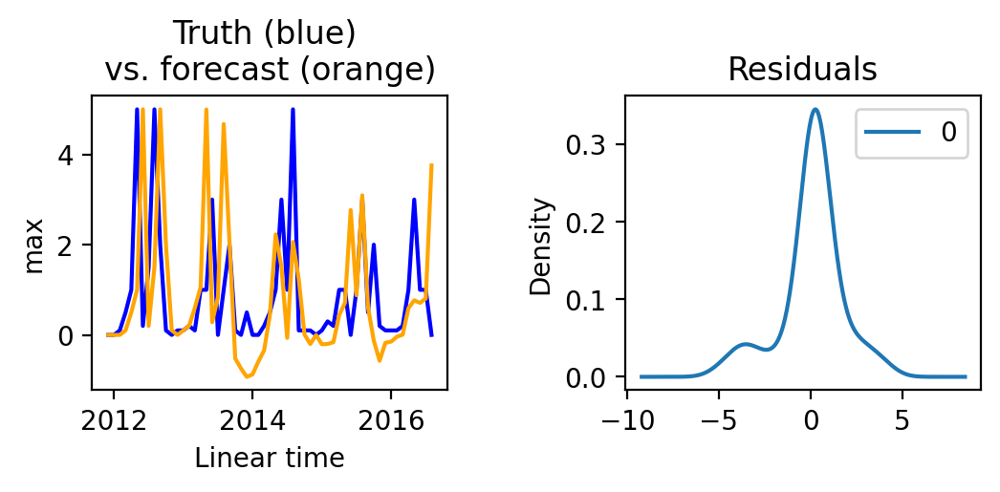

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                 -78.015
Date:                           Thu, 18 May 2023   AIC                            166.031
Time:                                   21:33:27   BIC                            174.952
Sample:                                        0   HQIC                           169.339
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2113      0.193     -1.094      0.274      -0.590       0.167
ar.L2         -0.0677      0.161     -0.420

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


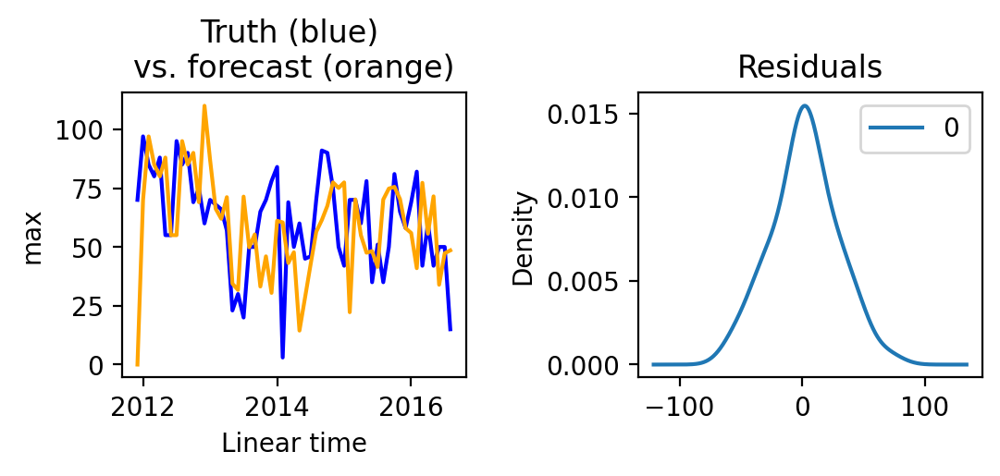

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -205.221
Date:                           Thu, 18 May 2023   AIC                            418.442
Time:                                   21:33:27   BIC                            425.579
Sample:                                        0   HQIC                           421.089
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0115      0.204      0.056      0.955      -0.388       0.411
ma.L1         -0.7989      0.132     -6.067

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


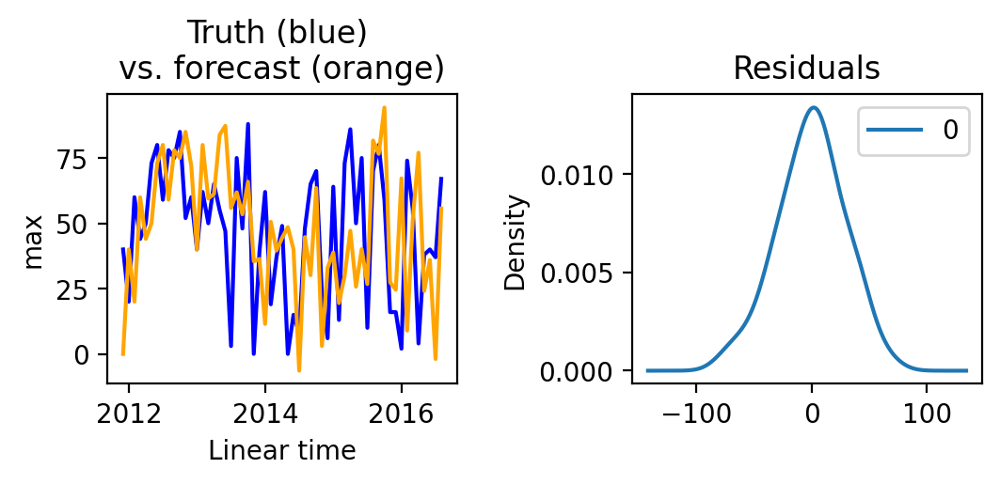

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -213.060
Date:                           Thu, 18 May 2023   AIC                            434.120
Time:                                   21:33:28   BIC                            441.257
Sample:                                        0   HQIC                           436.767
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1841      0.336     -0.547      0.584      -0.843       0.475
ma.L1         -0.6765      0.231     -2.934

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


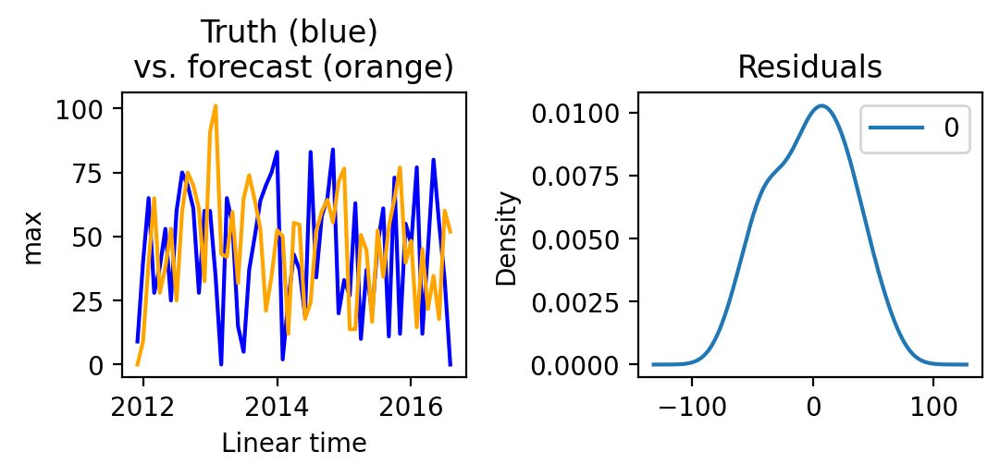

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   57
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -218.934
Date:                           Thu, 18 May 2023   AIC                            445.868
Time:                                   21:33:28   BIC                            453.005
Sample:                                        0   HQIC                           448.515
                                            - 57                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0379      0.177     -0.214      0.831      -0.385       0.310
ma.L1         -0.9985      6.100     -0.164

In [ ]:
# SARIMA plots

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


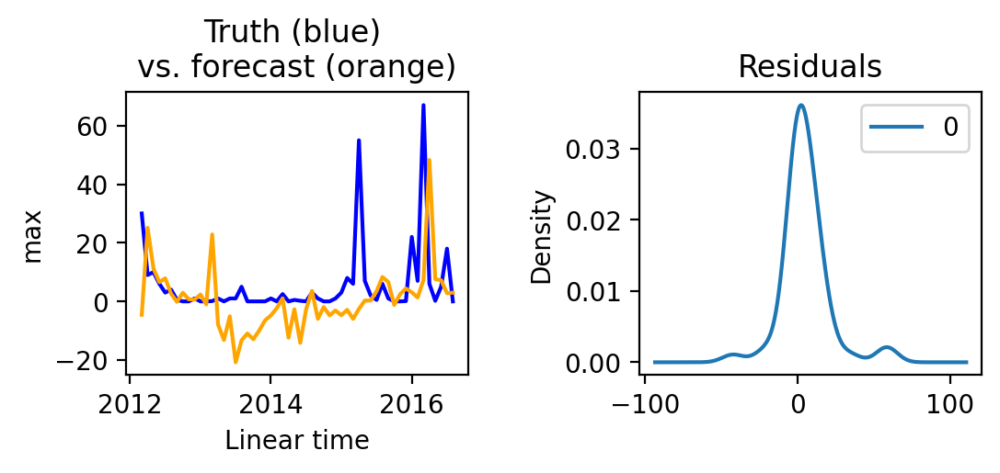

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -176.093
Date:                           Thu, 18 May 2023   AIC                            368.187
Time:                                   21:33:43   BIC                            381.895
Sample:                                        0   HQIC                           373.179
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0081      0.108     -0.075      0.940      -0.220       0.204
MOP_CO_M      -6.141e-05      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


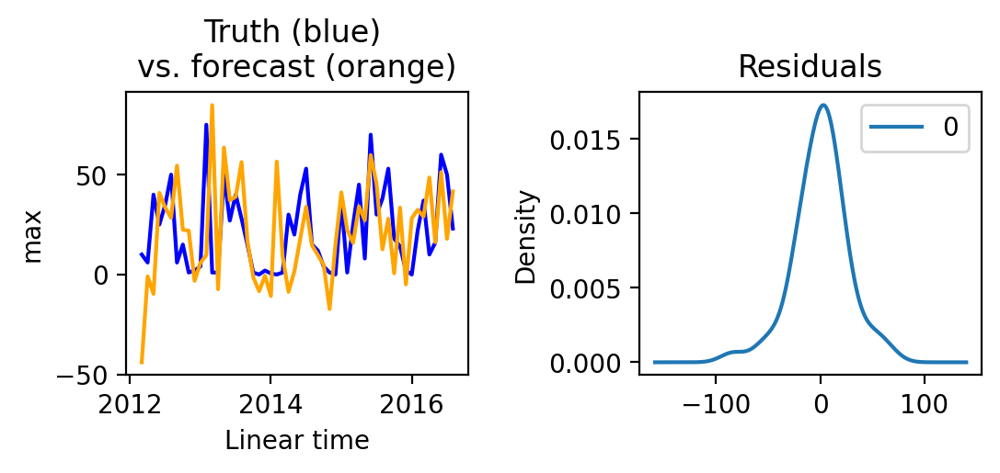

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                -180.166
Date:                           Thu, 18 May 2023   AIC                            378.332
Time:                                   21:33:44   BIC                            393.754
Sample:                                        0   HQIC                           383.948
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M        0.1076      0.039      2.727      0.006       0.030       0.185
MOP_CO_M          0.0003      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


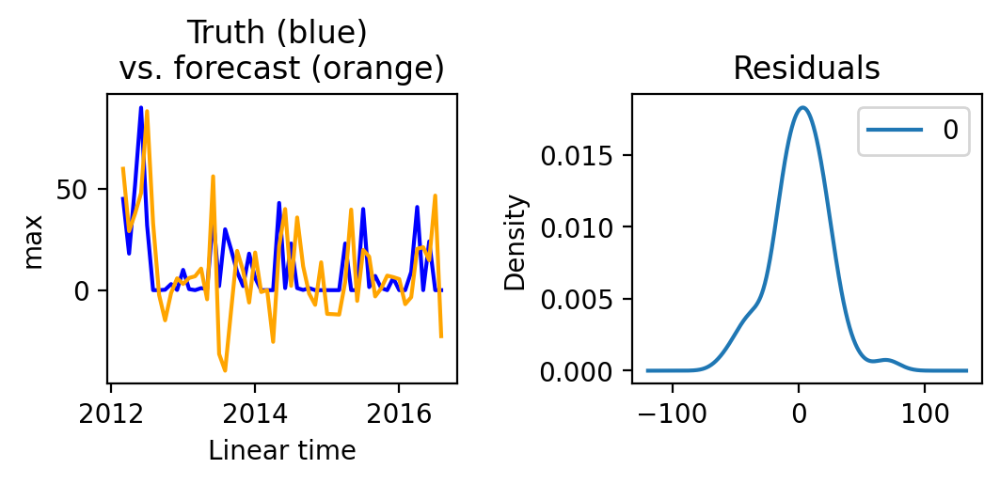

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -185.215
Date:                           Thu, 18 May 2023   AIC                            386.430
Time:                                   21:33:45   BIC                            400.138
Sample:                                        0   HQIC                           391.422
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M        0.0117      0.078      0.149      0.881      -0.141       0.165
MOP_CO_M         -0.0001      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


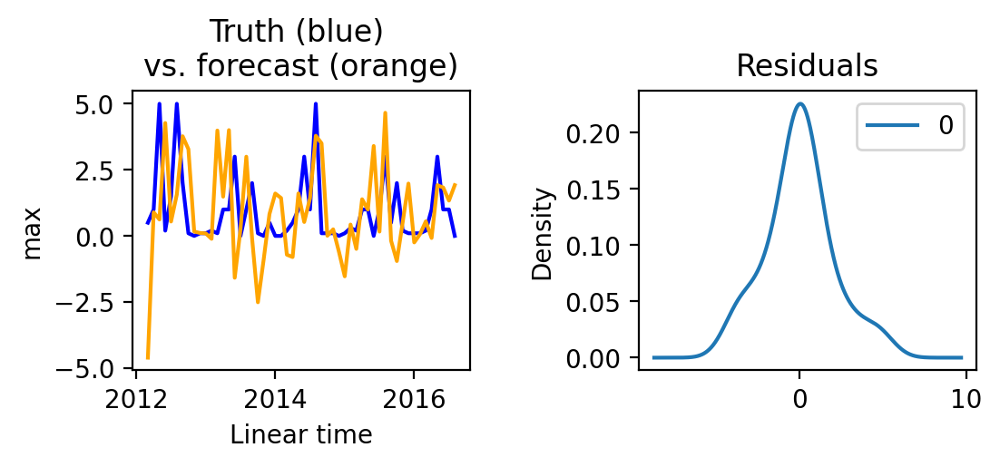

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(2, 1, 1)x(1, 1, [], 12)   Log Likelihood                 -78.917
Date:                           Thu, 18 May 2023   AIC                            175.834
Time:                                   21:33:46   BIC                            191.256
Sample:                                        0   HQIC                           181.450
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0081      0.003     -2.445      0.014      -0.015      -0.002
MOP_CO_M       5.912e-06   7.43e-0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


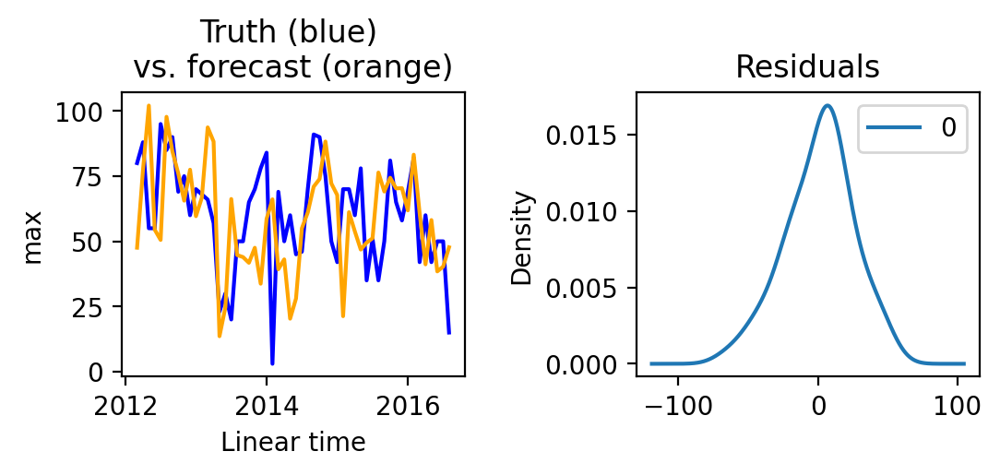

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -190.273
Date:                           Thu, 18 May 2023   AIC                            396.547
Time:                                   21:33:47   BIC                            410.255
Sample:                                        0   HQIC                           401.539
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0218      0.105     -0.207      0.836      -0.228       0.185
MOP_CO_M          0.0005      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


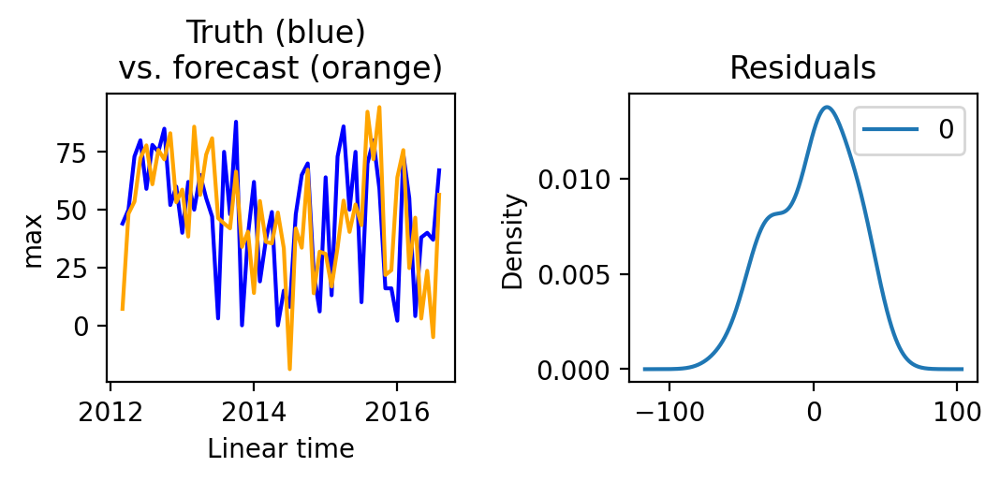

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -195.385
Date:                           Thu, 18 May 2023   AIC                            406.770
Time:                                   21:33:48   BIC                            420.478
Sample:                                        0   HQIC                           411.761
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0387      0.075     -0.514      0.607      -0.186       0.109
MOP_CO_M          0.0008      0.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

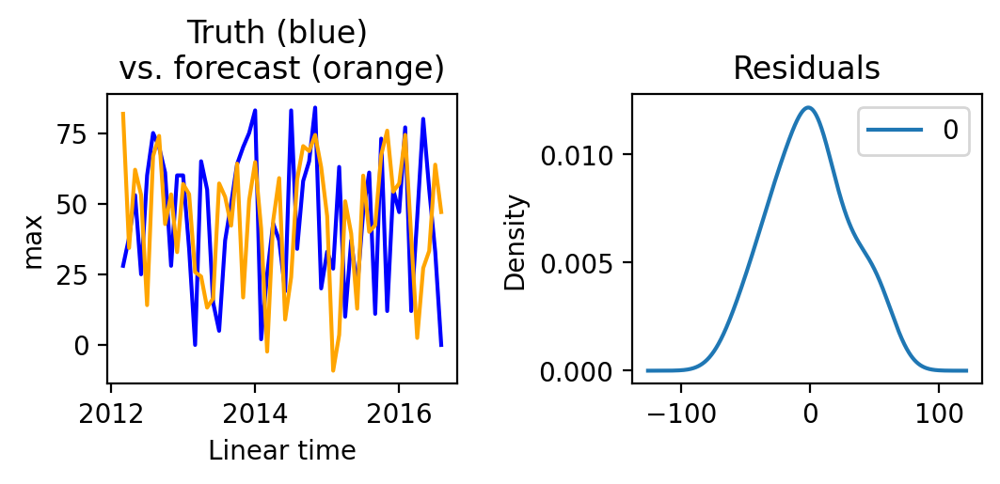

                                     SARIMAX Results                                     
Dep. Variable:                               max   No. Observations:                   54
Model:             ARIMA(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -201.000
Date:                           Thu, 18 May 2023   AIC                            418.001
Time:                                   21:33:49   BIC                            431.709
Sample:                                        0   HQIC                           422.993
                                            - 54                                         
Covariance Type:                             opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
AURA_NO2_M       -0.0842      0.121     -0.698      0.485      -0.320       0.152
MOP_CO_M          0.0005      0.00

In [ ]:
# SARIMAX plots

## 👓 References
[1] - https://neo.gsfc.nasa.gov/

## ⏭️ Appendix

### Data Quality

This was the first step made in the project to explore the features of the dataset and to understand the variables.

In [ ]:
file_path = 'AMPA_Data_Sample.xlsx'
sessil = 'Sessil (% Coverage)'
mobil = ' Mobil (nº individuals)'
df_sessil = pd.read_excel(file_path, sheet_name=sessil, engine='openpyxl')
df_mobil = pd.read_excel(file_path, sheet_name=mobil, engine='openpyxl')
df_sessil.head()

,Date,Hour,Tide,Weather Condition,Water temperature (ºC),Sampler,Zone,Supratidal/Middle Intertidal,Substrate,Chthamalus sp.,...,Alga castanha carnuda,Alga castanha tufosa,Alga verde/azul - lavanda,Sphacelaria rigidula (pompons castanhos),Cystoseira sp.,Laminaria sp.,TOTAL2,observações,Coluna1,Coluna2
0,2011-11-28,12:20:00,0.6,Clear sky,16,AF SF,D,Supra,Rock,7,...,0.0,0.0,0.0,0.0,0,0.0,93.3,0,0,0.0
1,2011-11-28,12:35:00,0.6,Clear sky,16,AF SF,D,Supra,Rock,0,...,0.0,0.0,0.0,0.0,0,0.0,0.1,,0,0.0
2,2011-11-28,10:10:00,0.6,Clear sky,16,AF SF,D,Medium,Puddle,0,...,0.0,0.0,0.0,0.0,0,0.0,100,0,0,0.0
3,2011-11-28,10:25:00,0.6,Clear sky,16,AF SF,D,Medium,Rock,8,...,0.0,0.0,0.0,0.0,0,0.0,99.5,,0,0.0
4,2011-11-28,10:40:00,0.6,Clear sky,16,AF SF,D,Medium,Rock,25,...,0.0,0.0,0.0,0.0,0,0.0,66.45,0,0,0.0


In [ ]:
print(df_sessil.dtypes)

Date                      datetime64[ns]
Hour                              object
Tide                             float64
Weather Condition                 object
Water temperature (ºC)            object
                               ...      
Laminaria sp.                    float64
TOTAL2                            object
observações                       object
Coluna1                           object
Coluna2                          float64
Length: 105, dtype: object


In [ ]:
print(df_sessil.describe)

<bound method NDFrame.describe of            Date      Hour  Tide Weather Condition Water temperature (ºC)  \
0    2011-11-28  12:20:00   0.6         Clear sky                     16   
1    2011-11-28  12:35:00   0.6         Clear sky                     16   
2    2011-11-28  10:10:00   0.6         Clear sky                     16   
3    2011-11-28  10:25:00   0.6         Clear sky                     16   
4    2011-11-28  10:40:00   0.6         Clear sky                     16   
...         ...       ...   ...               ...                    ...   
2006 2020-11-16  08:00:00   0.4             Sunny                     18   
2007 2020-11-16  08:00:00   0.4             Sunny                     18   
2008 2020-11-16  08:00:00   0.4             Sunny                     18   
2009 2020-11-16  08:00:00   0.4             Sunny                     18   
2010        NaT       NaN   NaN               NaN                    NaN   

       Sampler Zone Supratidal/Middle Intertidal  Sub

In [ ]:
#Removing the last line
df_sessil = df_sessil.iloc[0:2010,]

In [ ]:
#Excluding Substrate "High Tide" since there is no information there
df_sessil = df_sessil[df_sessil['Substrate'] != 'High Tide']

### Date

In [ ]:
print(df_sessil.groupby('Date').size().reset_index(name='Count'))

          Date  Count
0   2011-11-28     11
1   2011-11-29     11
2   2011-12-12     11
3   2011-12-14     11
4   2012-01-11     11
..         ...    ...
188 2020-05-08     10
189 2020-06-05     11
190 2020-07-06     12
191 2020-08-04      9
192 2020-11-16     10

[193 rows x 2 columns]


In [ ]:
df_sessil['Date'].isna().sum()

0

In [ ]:
# Create MonthYear variable
df_sessil.loc[:, 'MonthYear'] = df_sessil['Date'].dt.strftime('%m-%Y')

In [ ]:
print(df_sessil.groupby('MonthYear').size().reset_index(name='Count'))

   MonthYear  Count
0    01-2012     44
1    01-2013     22
2    01-2014     22
3    01-2015     22
4    01-2016     22
..       ...    ...
88   12-2013     22
89   12-2014     22
90   12-2015     22
91   12-2016     22
92   12-2017     22

[93 rows x 2 columns]


#### Tide

In [ ]:
print(df_sessil.groupby('Tide').size().reset_index(name='Count'))

    Tide  Count
0   0.30     11
1   0.36     11
2   0.38     11
3   0.40    102
4   0.42     11
5   0.49     11
6   0.50    185
7   0.52     22
8   0.54      2
9   0.56     11
10  0.59     11
11  0.60    226
12  0.61     11
13  0.63     11
14  0.64     33
15  0.65     11
16  0.66     22
17  0.67     12
18  0.69     11
19  0.70    309
20  0.71     11
21  0.73      1
22  0.76     11
23  0.78     22
24  0.80    296
25  0.82     11
26  0.83     22
27  0.84     22
28  0.85     11
29  0.86     22
30  0.87     22
31  0.88      5
32  0.90    334
33  0.92     22
34  0.96     11
35  0.99      5
36  1.00    115
37  1.10     11
38  1.20     11
39  1.40      3
40  2.40      1


In [ ]:
#Create categories for grouping Tide

bins = [0, 0.6, 0.7, 0.8, 0.9, 1.0, float('inf')]
labels = ['Tide: <= 0.6', 'Tide: > 0.6 and <= 0.7', 'Tide: > 0.7 and <= 0.8', 'Tide: > 0.8 and <= 0.9', 'Tide: > 0.9 and <= 1.0', 'Tide: > 1.0']

df_sessil['TideCategory'] = pd.cut(df_sessil['Tide'], bins=bins, labels=labels, right=False)

print(df_sessil.groupby('TideCategory').size().reset_index(name='Count'))

             TideCategory  Count
0            Tide: <= 0.6    388
1  Tide: > 0.6 and <= 0.7    337
2  Tide: > 0.7 and <= 0.8    354
3  Tide: > 0.8 and <= 0.9    411
4  Tide: > 0.9 and <= 1.0    372
5             Tide: > 1.0    141


#### Weather Condition

In [ ]:
print(df_sessil.groupby('Weather Condition').size().reset_index(name='Count'))

  Weather Condition  Count
0         Clear sky   1437
1            Cloudy    351
2     Fairly Cloudy     33
3              Rain     83
4             Sunny     90
5   Sunny and Windy      9


#### Water temperature (ºC)

In [ ]:
print(df_sessil.groupby('Water temperature (ºC)').size().reset_index(name='Count'))

    Water temperature (ºC)  Count
0                     11.0     11
1                     12.0     18
2                     13.0     71
3                     13.2     11
4                     13.3     11
5                     14.0    115
6                     14.1     22
7                     14.2     11
8                     14.5     11
9                     14.6     11
10                    14.9     11
11                    15.0    357
12                    15.2     11
13                    15.4     11
14                    15.6     11
15                    16.0    204
16                    16.2     11
17                    16.5     33
18                    16.9     11
19                    17.0    230
20                    17.4     22
21                    17.5     44
22                    17.8     11
23                    17.9     11
24                    18.0    205
25                    18.3     11
26                    19.0    243
27                    19.2     11
28            

In [ ]:
#Create categories for grouping Water Temperature

bins = [0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, float('inf')]
labels = ['Water: <= 14.0', 'Water: > 14.0 and <= 15.0', 'Water: > 15.0 and <= 16.0', 'Water: > 16.0 and <= 17.0', 'Water: > 17.0 and <= 18.0', 'Water: > 18.0 and <= 19.0', 'Water: > 19.0 and <= 20.0', 'Water: > 20.0']

df_sessil['WaterCategory'] = pd.cut(df_sessil['Water temperature (ºC)'], bins=bins, labels=labels, right=False)

print(df_sessil.groupby('WaterCategory').size().reset_index(name='Count'))

               WaterCategory  Count
0             Water: <= 14.0    122
1  Water: > 14.0 and <= 15.0    181
2  Water: > 15.0 and <= 16.0    390
3  Water: > 16.0 and <= 17.0    259
4  Water: > 17.0 and <= 18.0    318
5  Water: > 18.0 and <= 19.0    216
6  Water: > 19.0 and <= 20.0    254
7              Water: > 20.0    247


In [ ]:
df_sessil['Water temperature (ºC)'].isna().sum()

16

#### Zone

In [ ]:
print(df_sessil.groupby('Zone').size().reset_index(name='Count'))

  Zone  Count
0    A    627
1    B    352
2    D    432
3    E    512
4    F     80


#### Supratidal/Middle Intertidal

In [ ]:
print(df_sessil.groupby('Supratidal/Middle Intertidal').size().reset_index(name='Count'))

  Supratidal/Middle Intertidal  Count
0                       Medium   1269
1                      Medium       1
2                        Super      1
3                        Supra    730
4                       Supra       2


In [ ]:
# Fixing the values
df_sessil['Supratidal/Middle Intertidal'] = df_sessil['Supratidal/Middle Intertidal'].str.strip()
df_sessil['Supratidal/Middle Intertidal'] = df_sessil['Supratidal/Middle Intertidal'].apply(lambda x: 'Supra' if x == 'Super' else x)
print(df_sessil.groupby('Supratidal/Middle Intertidal').size().reset_index(name='Count'))

  Supratidal/Middle Intertidal  Count
0                       Medium   1270
1                        Supra    733


#### Substrate

In [ ]:
print(df_sessil.groupby('Substrate').size().reset_index(name='Count'))

                  Substrate  Count
0                      Rock      2
1                     Canal      1
2                    Pebble     49
3                    Puddle     26
4             Puddle/Pebble      1
5               Puddle/Rock    275
6          Puddle/Rock/Sand    101
7   Puddle/Rock/Sand/Pebble      1
8               Puddle/Sand      7
9                      Rock    860
10               Rock/Canal      4
11              Rock/Pebble      8
12                Rock/Sand    523
13          Rock/Sand/Canal      4
14      Rock/Sand/Canal/Sea      1
15         Rock/Sand/Pebble      5
16            Rock/Sand/Sea     17
17                 Rock/Sea     11
18                     Sand     78
19       Sand/ Pebble/Canal      1
20               Sand/Canal      1
21              Sand/Pebble     12
22                 Sand/Sea      4
23                      Sea      1


In [ ]:
#Fixing the values with space
df_sessil['Substrate_clean'] = df_sessil['Substrate'].str.replace(' ', '')
print(df_sessil.groupby('Substrate_clean').size().reset_index(name='Count'))

            Substrate_clean  Count
0                     Canal      1
1                    Pebble     49
2                    Puddle     26
3             Puddle/Pebble      1
4               Puddle/Rock    275
5          Puddle/Rock/Sand    101
6   Puddle/Rock/Sand/Pebble      1
7               Puddle/Sand      7
8                      Rock    862
9                Rock/Canal      4
10              Rock/Pebble      8
11                Rock/Sand    523
12          Rock/Sand/Canal      4
13      Rock/Sand/Canal/Sea      1
14         Rock/Sand/Pebble      5
15            Rock/Sand/Sea     17
16                 Rock/Sea     11
17                     Sand     78
18               Sand/Canal      1
19              Sand/Pebble     12
20        Sand/Pebble/Canal      1
21                 Sand/Sea      4
22                      Sea      1


In [ ]:
#Creating columns for each substrate
substrate_dummies = df_sessil['Substrate_clean'].str.get_dummies(sep='/')

In [ ]:
substrate_dummies.sum()

Canal       12
Pebble      77
Puddle     411
Rock      1812
Sand       755
Sea         34
dtype: int64

In [ ]:
# Concatenate the dummy variables with df_sessil
df_sessil = pd.concat([df_sessil, substrate_dummies], axis=1)

### Analysing Correlation for Invasive Species

We examined the interconnection between species, specifically investigating the potential relationship between invasive species and other species. Our aim was to determine if it would be worthwhile to explore additional species within the model. However, we observed that the species exhibiting moderated correlations with invasive species had fewer available data points, and this pattern did not hold much significance for the model.

In [ ]:
#Removing unnecessary columns for this analysis
df_sessil_clean = df_sessil.drop(['Substrate', 'Substrate_clean','Date', 'Hour', 'Tide', 'Month', 'Year','Weather Condition', 'Water temperature (ºC)', 'Sampler', 'TOTAL2', 'observações', 'Coluna1', 'Coluna2'], axis=1)

In [ ]:
#Grouping Asparagopsis armata
df_sessil_clean["Asparagopsis armata"] = df_sessil_clean["Asparagopsis armata (tufosa)"] + df_sessil_clean["Asparagopsis armata (adulta)"]

In [ ]:
#Removing unnecessary columns
columns_to_delete = ['Zone', 'Supratidal/Middle Intertidal', 'TideCategory', 'WaterCategory', 'Asparagopsis armata (tufosa)', 'Asparagopsis armata (adulta)']
df_sessil_clean.drop(columns=columns_to_delete, inplace=True)

##### Grouping by MonthYear using the max of each month

In [ ]:
df_sessil_grouped = df_sessil_clean.groupby('MonthYear').max()

In [ ]:
#Correlation among species

marine_species = ['Chthamalus sp.',
 'Balanus perforatus',
 'Patella sp.',
 'Siphonaria algesirae',
 'Gibbula sp.',
 'Monodonta lineata',
 'Littorina neritoides',
 'Mytillus sp.',
 'Nassariidae (búzio)',
 'Chiton sp.',
 'Pollicipes pollicipes',
 'Actinia equina ',
 'Anemonia sulcata ',
 'Ophiothrix sp.',
 'Paracentrotus lividus',
 'Hymeniacidon sanguinea',
 'Aglaophenia pluma (hidrozoário branco ramificado)',
 'Alga branca ramificada',
 'Sabellaria alveolata  (tubos)',
 'Cerianthidae',
 'Anémona N.I.',
 'Actinia fragacea',
 'Gymnangium montagui',
 'Anémona branca com estrias (fam. Cerianthidae)',
 'Actinothoe sphyrodeta (anémona branca e laranja)',
 'Oncidiella celtica (lesma)',
 'Calliostoma sp. (burrié bicudo)',
 'Polysyncraton sp. (ascídias vermelhas)',
 'Didemnum sp. (ascídeas brancas)',
 'Burrié negro N.I.',
 'Búzio/burrié n.i.',
 'Watersipora subtorquata (Ascídea)',
 'Verrucaria maura ',
 'Lichina pygmaea (líquene folhoso)',
 'Coralina elongata',
 'Lithophillum incrustans',
 'Litophylum lichenoides',
 'Litophylum tortuosum',
 'Mesophylum lichenoides',
 'Gelidium sp. (tipo raquete)',
 'Porphyra sp.',
 'Ceramium (forma taças)',
 'Mastocarpus sp. (alga preta só mediolitoral)',
 'Gigartina sp. (língua do diabo)',
 'Plocamium sp.',
 'Caulacanthus sp.',
 'Condracanthus',
 'Alga vermelha filamentosa',
 'Alga vermelha vesicular',
 'Alga vermelha laminada',
 'Alga vermelha carnuda',
 'Hildenbrandia sp. (incrustante vermelha)',
 'Chondria coerulescens (alga verde/azul filamentosa)',
 'Alga vermelha "encaracolada" (que parece ceramium pequeno) ',
 'Alga vermelha semelhante a Ulva rigida',
 'Porphira',
 'Osmundea pinnatifida',
 'Alga vermelha ramificada (Polysiphonia?)',
 'Ahnfeltiopsis devoniensis',
 'Stypocaulon scoparium (alga verde tufosa que parece pinheiro)',
 'Ulva rigida',
 'Cladophora sp. (limo)',
 'Limo N.I.',
 'Ulva intestinalis',
 'Ulva sp. ',
 'Codium sp. (alga verde carnuda)',
 'Alga verde carnuda ramificada',
 'Nemoderma sp.(alga tipo musgo)',
 'alga verde tufosa',
 'alga verde (tipo couve flor)',
 'Alga verde incrustante',
 'Alga verde n.i.',
 'Alga verde filamentosa',
 'Alga amarela tipo codium viscoso',
 'Cladostephus spongiosus (codium que parece que tem areia)',
 'Codium adhaerens (tipo nenúfar)',
 'Colpomenia sinuosa (alga bolhas)',
 'Fucus vesiculosus ',
 'Dictyota dichotoma (alga azul laminada)',
 'Dictyota castanha',
 'Alga castanha sp.',
 'Alga castanha laminada',
 'Alga castanha filamentosa',
 'Alga castanha incrustante',
 'Alga castanha carnuda',
 'Alga castanha tufosa',
 'Alga verde/azul - lavanda',
 'Sphacelaria rigidula (pompons castanhos)',
 'Cystoseira sp.',
 'Laminaria sp.', 'Asparagopsis armata']

species_of_interest = [
    "Asparagopsis armata",
    "Osmundea pinnatifida",
    "Cladophora sp. (limo)",
    "Codium sp. (alga verde carnuda)",
    "Colpomenia sinuosa (alga bolhas)"
]

df_sessil_clean_species = df_sessil_grouped[marine_species]

#### Correlations above or below 0.4 for invasive species

In [ ]:
corr_matrix = df_sessil_clean_species.corr()

corr_species = corr_matrix.loc[:, species_of_interest]

# Exclude correlations between same species
corr_species = corr_species[corr_species.abs() != 1.0]

threshold = 0.4
corr_above_threshold = corr_species[(corr_species > threshold) | (corr_species < -threshold)]

correlation_list = corr_above_threshold.stack().reset_index().values.tolist()

print(correlation_list)

[['Gigartina sp. (língua do diabo)', 'Cladophora sp. (limo)', -0.40279513833540564], ['Osmundea pinnatifida', 'Colpomenia sinuosa (alga bolhas)', 0.5518097819400423], ['Ulva rigida', 'Cladophora sp. (limo)', 0.422898004245653], ['Cladostephus spongiosus (codium que parece que tem areia)', 'Colpomenia sinuosa (alga bolhas)', 0.40824675421391654], ['Colpomenia sinuosa (alga bolhas)', 'Osmundea pinnatifida', 0.5518097819400423]]
